In [1166]:
# import the libraries
import pandas as pd 
import numpy as np 
import os
import matplotlib.pyplot as plt 
import seaborn as sns  
%matplotlib inline
import scipy.stats as stats  
from scipy.stats import norm
from scipy.stats import zscore
from scipy.stats import   ttest_1samp , ttest_ind
from statsmodels.formula.api import ols     
from statsmodels.stats.anova import _get_covariance,anova_lm 
import statsmodels.stats.api as sm
from sklearn.metrics import mean_absolute_error, mean_squared_error
from factor_analyzer import FactorAnalyzer # Perform statistical tests before PCA 
import warnings
warnings.filterwarnings("ignore")


Problem - 1
Context
The comp-activ database comprises activity measures of computer systems. Data was gathered from a Sun Sparcstation 20/712 with 128 Mbytes of memory, operating in a multi-user university department. Users engaged in diverse tasks, such as internet access, file editing, and CPU-intensive programs.

Being an aspiring data scientist, you aim to establish a linear equation for predicting 'usr' (the percentage of time CPUs operate in user mode). Your goal is to analyze various system attributes to understand their influence on the system's 'usr' mode.

In [1167]:
df=pd.read_excel('compactiv.xlsx')

In [1168]:
df

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
0,1,0,2147,79,68,0.2,0.20,40671.0,53995.0,0.00,...,0.00,0.0,1.60,2.60,16.00,26.40,CPU_Bound,4670,1730946,95
1,0,0,170,18,21,0.2,0.20,448.0,8385.0,0.00,...,0.00,0.0,0.00,0.00,15.63,16.83,Not_CPU_Bound,7278,1869002,97
2,15,3,2162,159,119,2.0,2.40,NaN,31950.0,0.00,...,0.00,1.2,6.00,9.40,150.20,220.20,Not_CPU_Bound,702,1021237,87
3,0,0,160,12,16,0.2,0.20,NaN,8670.0,0.00,...,0.00,0.0,0.20,0.20,15.60,16.80,Not_CPU_Bound,7248,1863704,98
4,5,1,330,39,38,0.4,0.40,NaN,12185.0,0.00,...,0.00,0.0,1.00,1.20,37.80,47.60,Not_CPU_Bound,633,1760253,90
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8187,16,12,3009,360,244,1.6,5.81,405250.0,85282.0,8.02,...,55.11,0.6,35.87,47.90,139.28,270.74,CPU_Bound,387,986647,80
8188,4,0,1596,170,146,2.4,1.80,89489.0,41764.0,3.80,...,0.20,0.8,3.80,4.40,122.40,212.60,Not_CPU_Bound,263,1055742,90
8189,16,5,3116,289,190,0.6,0.60,325948.0,52640.0,0.40,...,0.00,0.4,28.40,45.20,60.20,219.80,Not_CPU_Bound,400,969106,87
8190,32,45,5180,254,179,1.2,1.20,62571.0,29505.0,1.40,...,18.04,0.4,23.05,24.25,93.19,202.81,CPU_Bound,141,1022458,83


In [1169]:
#Problem 1 - Define the problem and perform exploratory Data Analysis

In [1170]:
df.head(10)

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
0,1,0,2147,79,68,0.2,0.2,40671.0,53995.0,0.0,...,0.0,0.0,1.6,2.6,16.00,26.40,CPU_Bound,4670,1730946,95
1,0,0,170,18,21,0.2,0.2,448.0,8385.0,0.0,...,0.0,0.0,0.0,0.0,15.63,16.83,Not_CPU_Bound,7278,1869002,97
2,15,3,2162,159,119,2.0,2.4,NaN,31950.0,0.0,...,0.0,1.2,6.0,9.4,150.20,220.20,Not_CPU_Bound,702,1021237,87
3,0,0,160,12,16,0.2,0.2,NaN,8670.0,0.0,...,0.0,0.0,0.2,0.2,15.60,16.80,Not_CPU_Bound,7248,1863704,98
4,5,1,330,39,38,0.4,0.4,NaN,12185.0,0.0,...,0.0,0.0,1.0,1.2,37.80,47.60,Not_CPU_Bound,633,1760253,90
5,0,0,1201,65,61,0.4,0.4,NaN,58703.0,0.0,...,0.0,0.0,0.0,0.0,28.40,34.40,Not_CPU_Bound,6854,1877461,96
6,1,0,5744,168,190,0.2,0.2,NaN,189975.0,6.0,...,0.0,4.4,0.6,0.6,27.40,28.60,Not_CPU_Bound,312,1013458,89
7,21,18,2799,291,211,0.6,0.4,NaN,259868.0,2.6,...,0.0,0.0,1.0,1.0,35.40,71.00,CPU_Bound,87,13,0
8,0,0,264,42,33,0.2,0.2,NaN,10116.0,0.0,...,0.0,0.0,0.4,0.8,15.63,18.44,Not_CPU_Bound,1374,1749756,98
9,0,0,188,13,24,0.2,0.2,NaN,6777.0,0.0,...,0.0,0.0,0.0,0.0,15.60,16.80,Not_CPU_Bound,5310,1859912,98


In [1171]:
df.tail(10)

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
8182,10,0,5975,692,612,2.20,2.00,505718.0,475455.0,5.99,...,122.55,0.40,24.15,72.85,95.21,230.54,Not_CPU_Bound,126,1039337,77
8183,4,3,1509,501,139,0.60,1.00,312242.0,255308.0,0.00,...,0.00,0.00,3.20,3.20,52.60,119.60,CPU_Bound,1051,1600333,92
8184,8,2,4784,416,240,1.20,1.60,442876.0,110453.0,7.82,...,129.06,0.40,35.27,48.70,106.81,329.86,CPU_Bound,205,1011407,77
8185,13,0,4279,235,176,12.22,34.47,289309.0,30701.0,0.40,...,7.01,8.82,4.21,4.21,397.60,751.30,Not_CPU_Bound,184,1079269,61
8186,0,0,300,56,46,0.20,0.20,1995.0,18052.0,0.80,...,0.00,0.00,0.00,0.00,21.00,18.00,Not_CPU_Bound,272,1754832,97
8187,16,12,3009,360,244,1.60,5.81,405250.0,85282.0,8.02,...,55.11,0.60,35.87,47.90,139.28,270.74,CPU_Bound,387,986647,80
8188,4,0,1596,170,146,2.40,1.80,89489.0,41764.0,3.80,...,0.20,0.80,3.80,4.40,122.40,212.60,Not_CPU_Bound,263,1055742,90
8189,16,5,3116,289,190,0.60,0.60,325948.0,52640.0,0.40,...,0.00,0.40,28.40,45.20,60.20,219.80,Not_CPU_Bound,400,969106,87
8190,32,45,5180,254,179,1.20,1.20,62571.0,29505.0,1.40,...,18.04,0.40,23.05,24.25,93.19,202.81,CPU_Bound,141,1022458,83
8191,2,0,985,55,46,1.60,4.80,111111.0,22256.0,0.00,...,0.00,0.20,3.40,6.20,91.80,110.00,CPU_Bound,659,1756514,94


In [1172]:
#column types and number of values

In [1173]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8192 entries, 0 to 8191
Data columns (total 22 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   lread     8192 non-null   int64  
 1   lwrite    8192 non-null   int64  
 2   scall     8192 non-null   int64  
 3   sread     8192 non-null   int64  
 4   swrite    8192 non-null   int64  
 5   fork      8192 non-null   float64
 6   exec      8192 non-null   float64
 7   rchar     8088 non-null   float64
 8   wchar     8177 non-null   float64
 9   pgout     8192 non-null   float64
 10  ppgout    8192 non-null   float64
 11  pgfree    8192 non-null   float64
 12  pgscan    8192 non-null   float64
 13  atch      8192 non-null   float64
 14  pgin      8192 non-null   float64
 15  ppgin     8192 non-null   float64
 16  pflt      8192 non-null   float64
 17  vflt      8192 non-null   float64
 18  runqsz    8192 non-null   object 
 19  freemem   8192 non-null   int64  
 20  freeswap  8192 non-null   int6

In [1174]:
#shape of the data
df.shape

(8192, 22)

In [1175]:
#summary of the data 
df.describe()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgfree,pgscan,atch,pgin,ppgin,pflt,vflt,freemem,freeswap,usr
count,8192.000000,8192.000000,8192.000000,8192.000000,8192.000000,8192.000000,8192.000000,8.088000e+03,8.177000e+03,8192.000000,...,8192.000000,8192.000000,8192.000000,8192.000000,8192.000000,8192.000000,8192.000000,8192.000000,8.192000e+03,8192.000000
mean,19.559692,13.106201,2306.318237,210.479980,150.058228,1.884554,2.791998,1.973857e+05,9.590299e+04,2.285317,...,11.919712,21.526849,1.127505,8.277960,12.388586,109.793799,185.315796,1763.456299,1.328126e+06,83.968872
std,53.353799,29.891726,1633.617322,198.980146,160.478980,2.479493,5.212456,2.398375e+05,1.408417e+05,5.307038,...,32.363520,71.141340,5.708347,13.874978,22.281318,114.419221,191.000603,2482.104511,4.220194e+05,18.401905
min,0.000000,0.000000,109.000000,6.000000,7.000000,0.000000,0.000000,2.780000e+02,1.498000e+03,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.200000,55.000000,2.000000e+00,0.000000
25%,2.000000,0.000000,1012.000000,86.000000,63.000000,0.400000,0.200000,3.409150e+04,2.291600e+04,0.000000,...,0.000000,0.000000,0.000000,0.600000,0.600000,25.000000,45.400000,231.000000,1.042624e+06,81.000000
50%,7.000000,1.000000,2051.500000,166.000000,117.000000,0.800000,1.200000,1.254735e+05,4.661900e+04,0.000000,...,0.000000,0.000000,0.000000,2.800000,3.800000,63.800000,120.400000,579.000000,1.289290e+06,89.000000
75%,20.000000,10.000000,3317.250000,279.000000,185.000000,2.200000,2.800000,2.678288e+05,1.061010e+05,2.400000,...,5.000000,0.000000,0.600000,9.765000,13.800000,159.600000,251.800000,2002.250000,1.730380e+06,94.000000
max,1845.000000,575.000000,12493.000000,5318.000000,5456.000000,20.120000,59.560000,2.526649e+06,1.801623e+06,81.440000,...,523.000000,1237.000000,211.580000,141.200000,292.610000,899.800000,1365.000000,12027.000000,2.243187e+06,99.000000


In [1176]:
#check the null values if any 
df.isnull().sum()

lread         0
lwrite        0
scall         0
sread         0
swrite        0
fork          0
exec          0
rchar       104
wchar        15
pgout         0
ppgout        0
pgfree        0
pgscan        0
atch          0
pgin          0
ppgin         0
pflt          0
vflt          0
runqsz        0
freemem       0
freeswap      0
usr           0
dtype: int64

In [1177]:
#Univariate analysis 

<Axes: >

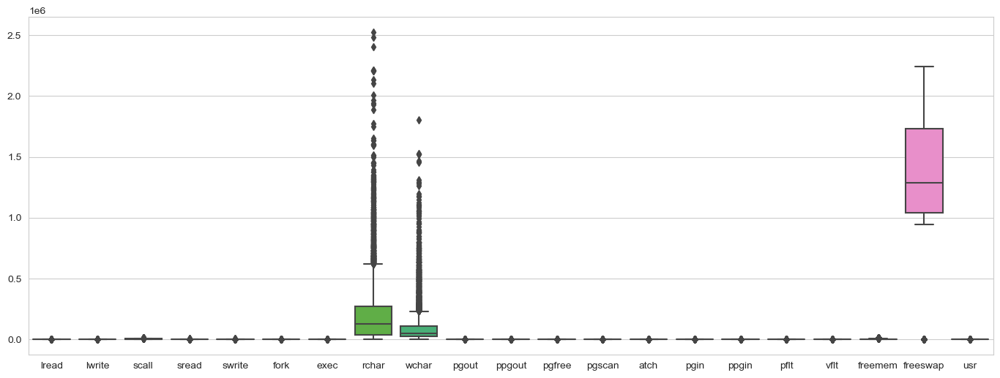

In [1178]:
plt.figure(figsize=(17,6))
sns.boxplot(data=df)

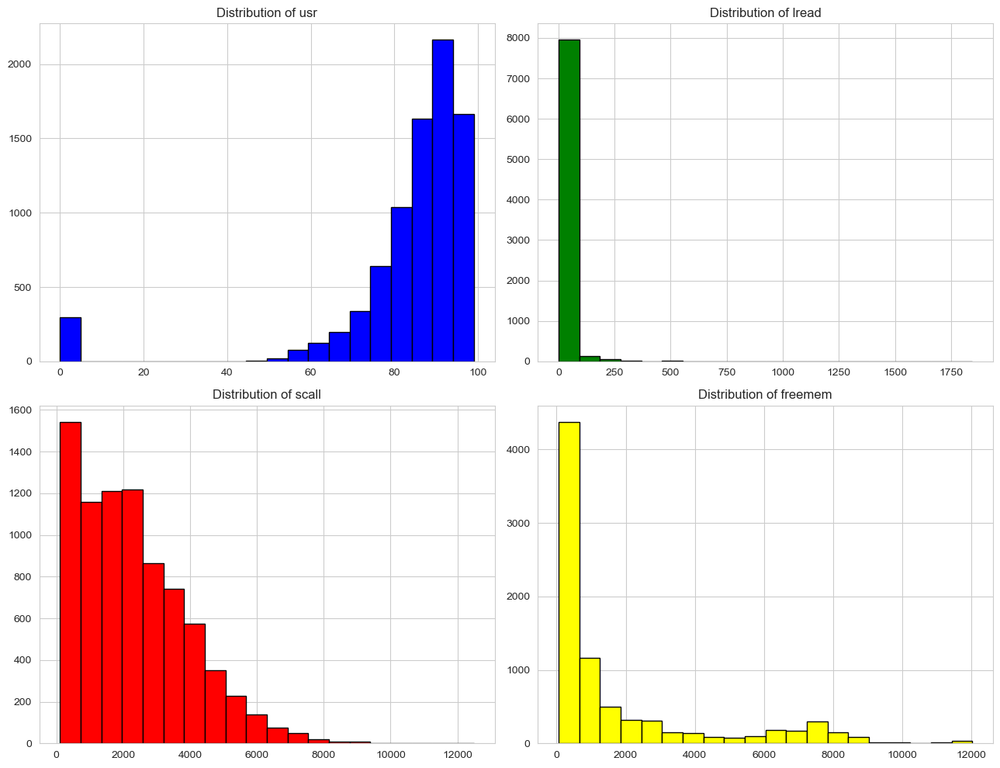

In [1179]:
#Histograms for Individual Variables

plt.figure(figsize=(13, 10))
plt.subplot(2, 2, 1)
plt.hist(df['usr'], bins=20, color='blue', edgecolor='black')
plt.title('Distribution of usr')

plt.subplot(2, 2, 2)
plt.hist(df['lread'], bins=20, color='green', edgecolor='black')
plt.title('Distribution of lread')

plt.subplot(2, 2, 3)
plt.hist(df['scall'], bins=20, color='red', edgecolor='black')
plt.title('Distribution of scall')

plt.subplot(2, 2, 4)
plt.hist(df['freemem'], bins=20, color='yellow', edgecolor='black')
plt.title('Distribution of freemem')

plt.tight_layout()
plt.show()

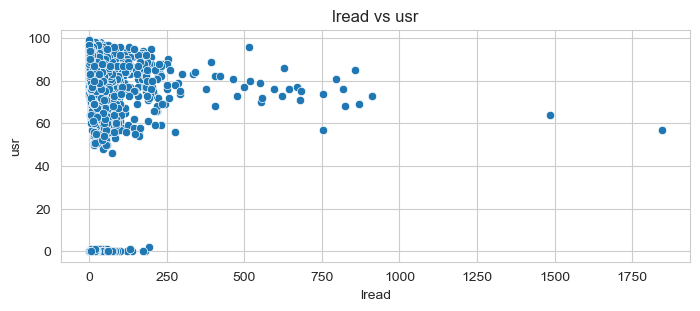

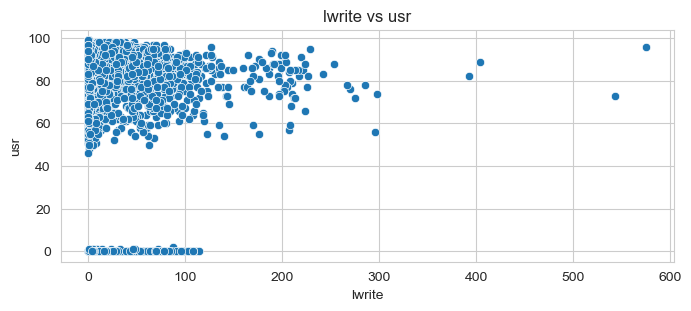

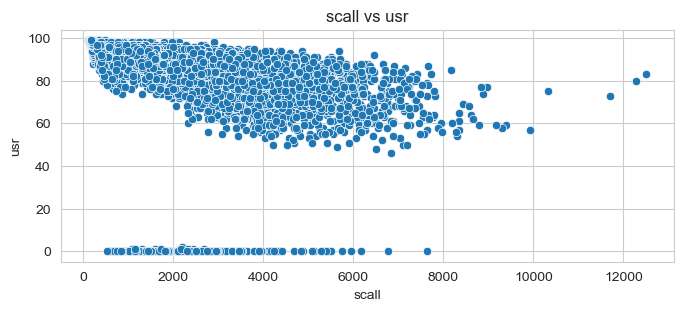

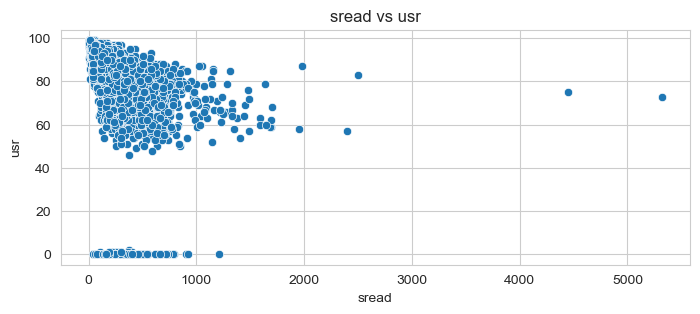

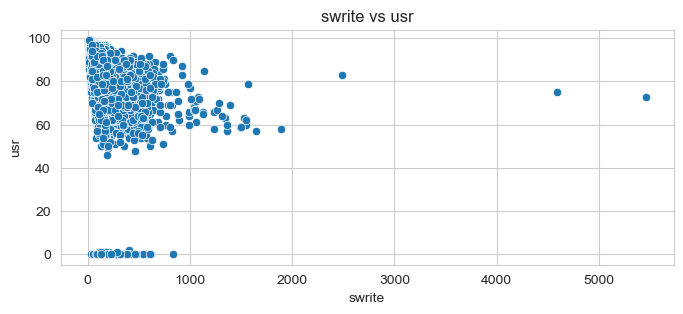

...

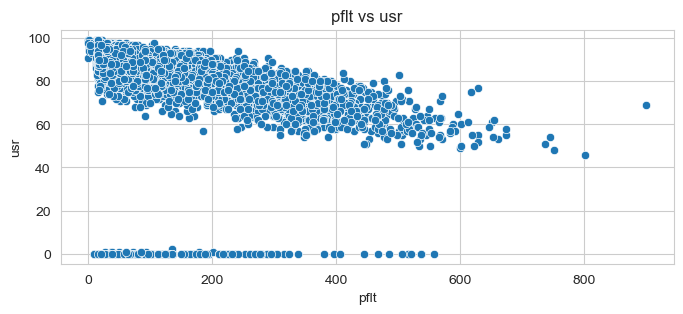

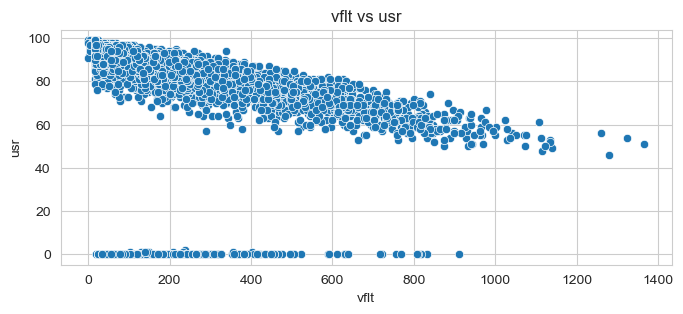

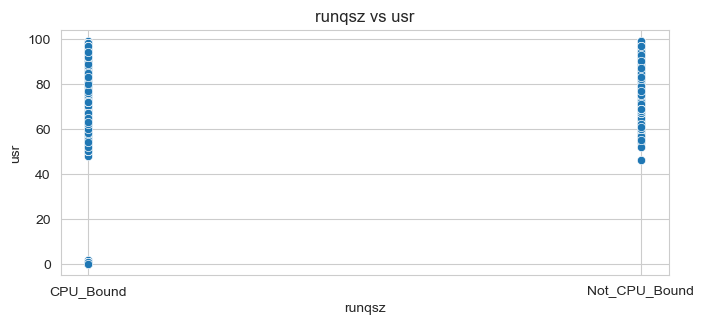

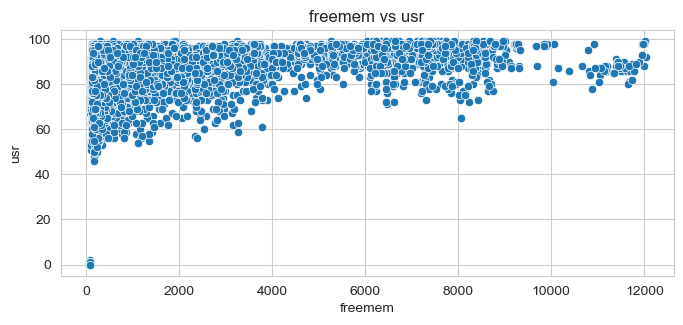

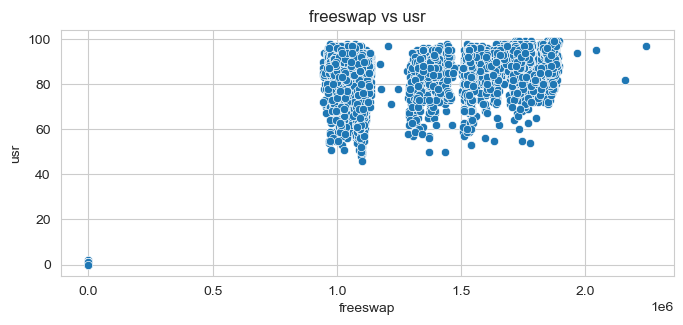

In [1180]:
col = df.columns
for i in range(len(col)-1):
    plt.figure(figsize=(20,20))
    plt.subplot(7,3,i+1)
    sns.scatterplot(x=df[df.columns[i]],y=df['usr'])
    plt.title('{} vs usr'.format(df.columns[i]))
    plt.tight_layout()
    plt.show();

In [1181]:
# Multivariate analysis 

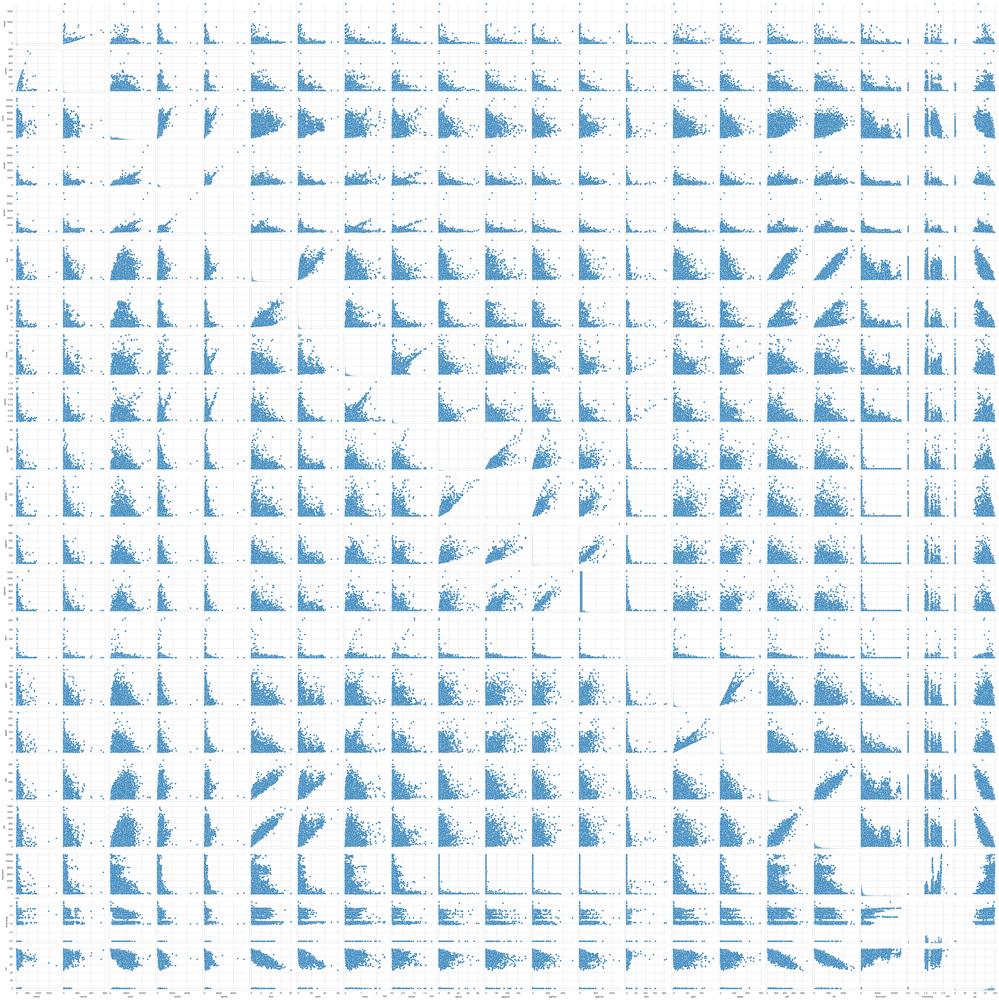

In [1182]:
#relationships between multiple variables
sns.pairplot(df)
plt.show()

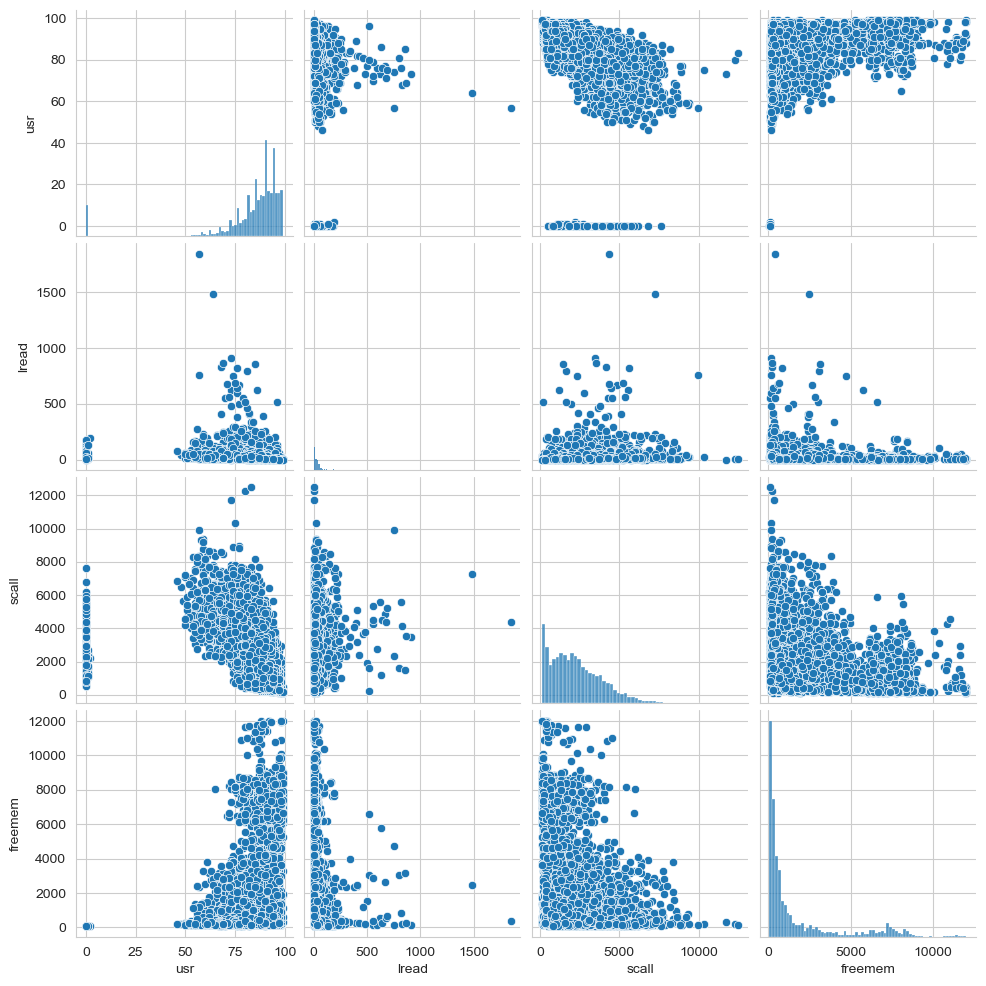

In [1183]:
selected_features = ['usr', 'lread', 'scall', 'freemem']
sns.pairplot(df[selected_features])
plt.show()

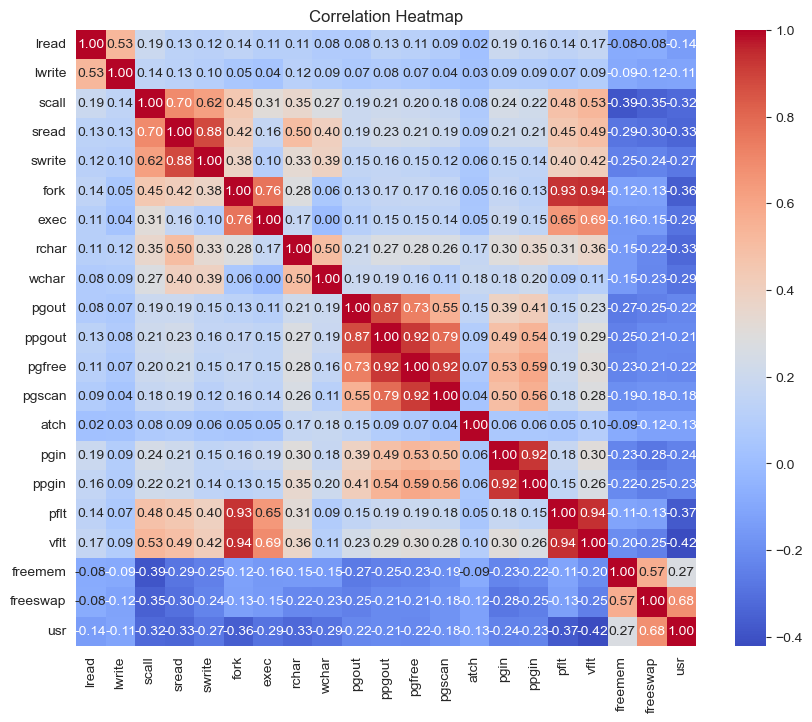

In [1184]:
# correlation between variables using a heatmap.
correlation_matrix = df.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap')
plt.show()

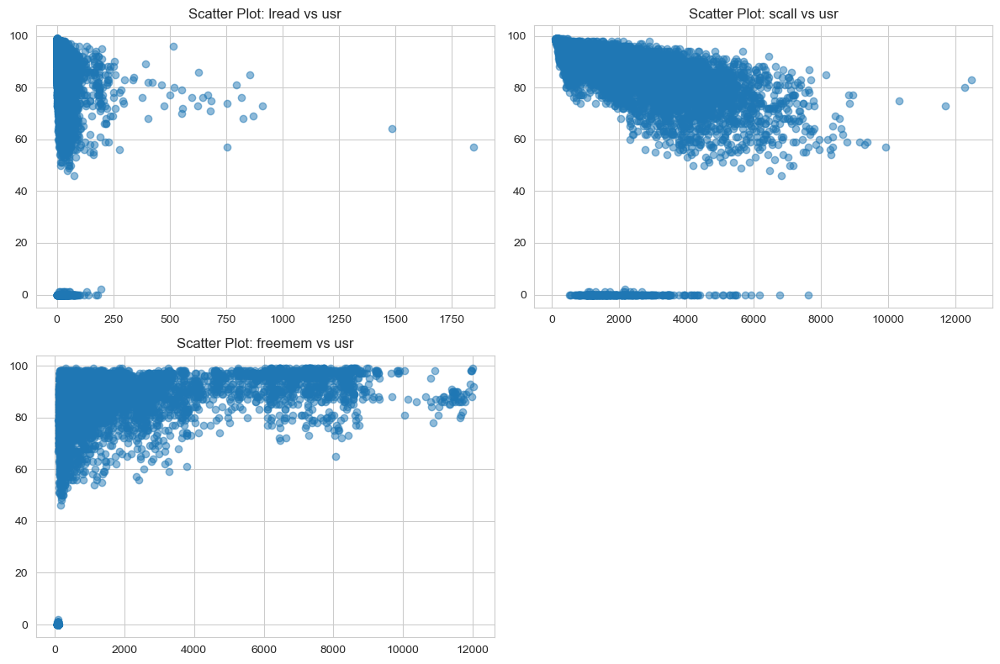

In [1185]:
#relationships between variables
plt.figure(figsize=(12, 8))
plt.subplot(2, 2, 1)
plt.scatter(df['lread'], df['usr'], alpha=0.5)
plt.title('Scatter Plot: lread vs usr')

plt.subplot(2, 2, 2)
plt.scatter(df['scall'], df['usr'], alpha=0.5)
plt.title('Scatter Plot: scall vs usr')

plt.subplot(2, 2, 3)
plt.scatter(df['freemem'], df['usr'], alpha=0.5)
plt.title('Scatter Plot: freemem vs usr')

plt.tight_layout()
plt.show()

In [1186]:
#Problem 1 - Data Pre-processing

In [1187]:
df.isnull().sum()

lread         0
lwrite        0
scall         0
sread         0
swrite        0
fork          0
exec          0
rchar       104
wchar        15
pgout         0
ppgout        0
pgfree        0
pgscan        0
atch          0
pgin          0
ppgin         0
pflt          0
vflt          0
runqsz        0
freemem       0
freeswap      0
usr           0
dtype: int64

In [1188]:
#replace null values with median
df['rchar'].fillna(df['rchar'].median(), inplace = True)
df['wchar'].fillna(df['wchar'].median(), inplace = True)

In [1189]:
df.isnull().sum()

lread       0
lwrite      0
scall       0
sread       0
swrite      0
fork        0
exec        0
rchar       0
wchar       0
pgout       0
ppgout      0
pgfree      0
pgscan      0
atch        0
pgin        0
ppgin       0
pflt        0
vflt        0
runqsz      0
freemem     0
freeswap    0
usr         0
dtype: int64

In [1190]:
#lets check the zero data 
(df == 0).sum().sum()

31775

In [1191]:
df=df.drop(["runqsz"], axis=1)

In [1192]:
#lets check the outliers 

<Axes: >

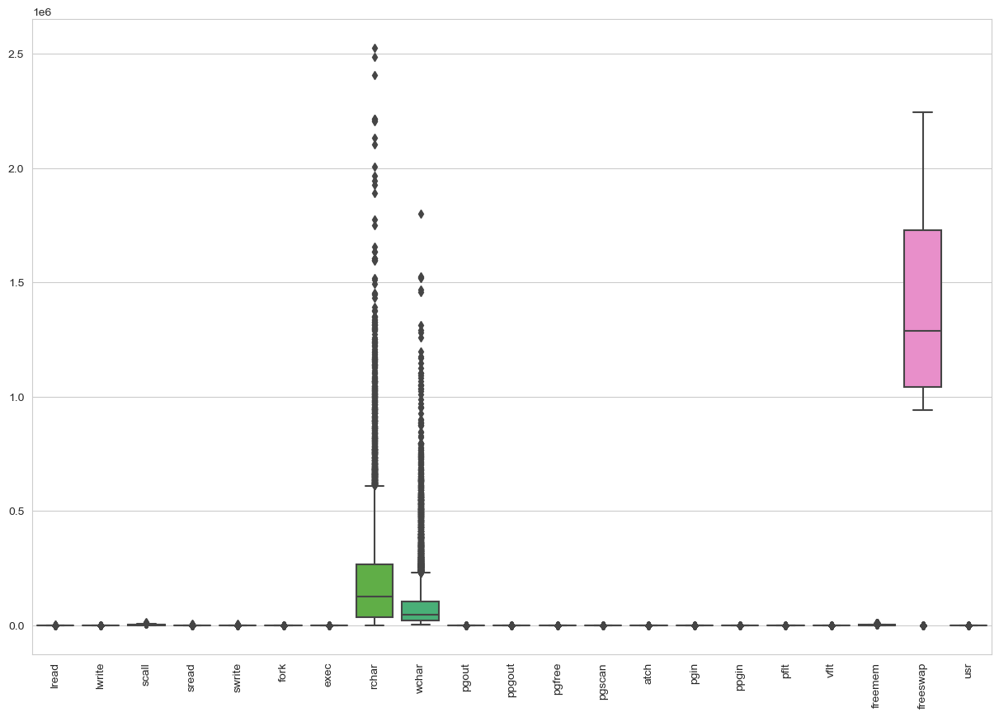

In [1193]:
plt.figure(figsize=(15,10))
plt.xticks(rotation=90)
sns.boxplot(data=df)

In [1194]:
#outlier treatment 
def remove_outlier(col):
    Q1,Q3=col.quantile([0.25,0.75])
    IQR=Q3-Q1
    lower_range= Q1-(1.5 * IQR)
    upper_range= Q3+(1.5 * IQR)
    return lower_range, upper_range 

In [1195]:
for i in df.columns:
    LL, UL = remove_outlier(df[i])
    df[i] = np.where(df[i] > UL, UL, df[i])
    df[i] = np.where(df[i] < LL, LL, df[i])

<Axes: >

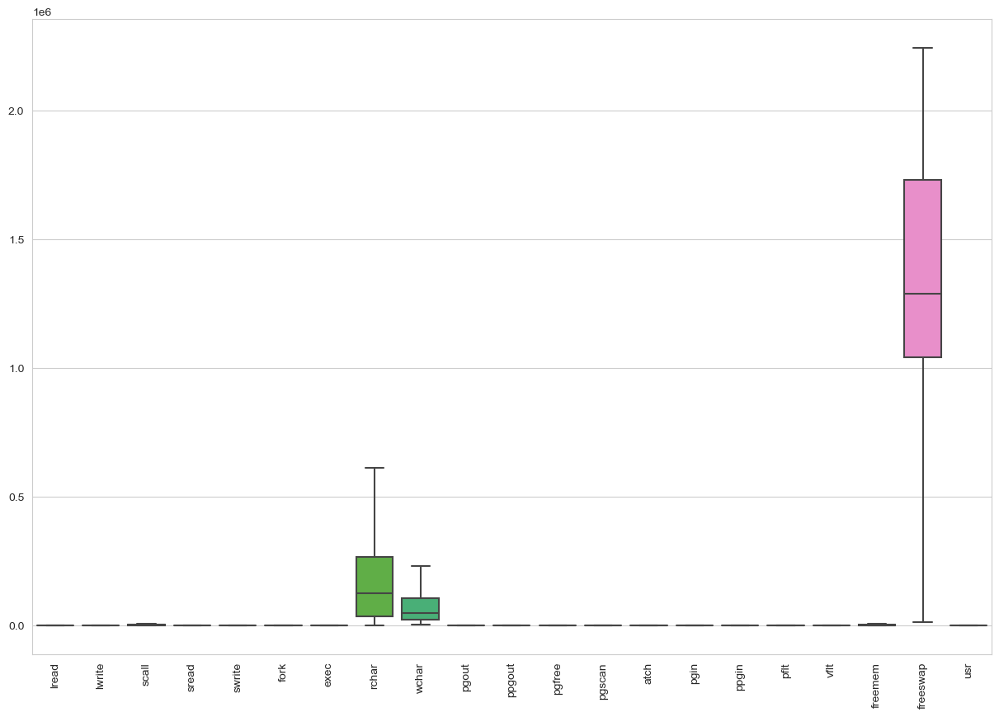

In [1196]:
plt.figure(figsize=(15,10))
plt.xticks(rotation=90)
sns.boxplot(data=df)

In [1197]:
#drop dupplicate data 
df.duplicated().sum()

0

In [1198]:
df=df.drop(["pgscan"], axis=1)

In [1199]:
df_corr = df.corr()
df_corr

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,ppgout,pgfree,atch,pgin,ppgin,pflt,vflt,freemem,freeswap,usr
lread,1.000000,0.834674,0.333572,0.326032,0.306542,0.365676,0.364062,0.255544,0.174410,0.208258,0.219798,0.214400,0.230628,0.283252,0.290564,0.375250,0.421079,-0.201369,-0.243903,-0.438163
lwrite,0.834674,1.000000,0.140213,0.148028,0.132097,0.093166,0.121778,0.117504,0.132595,0.090726,0.089149,0.082519,0.126769,0.113368,0.118388,0.102631,0.135243,-0.099558,-0.149630,-0.185695
scall,0.333572,0.140213,1.000000,0.763001,0.742206,0.474491,0.440010,0.386875,0.331933,0.297487,0.305507,0.300612,0.306359,0.335380,0.325487,0.485361,0.548081,-0.388969,-0.357864,-0.618932
sread,0.326032,0.148028,0.763001,1.000000,0.876652,0.528047,0.369723,0.576127,0.415059,0.301658,0.315648,0.311863,0.292044,0.346654,0.344586,0.529364,0.597892,-0.349887,-0.369897,-0.638072
swrite,0.306542,0.132097,0.742206,0.876652,1.000000,0.519148,0.313323,0.419759,0.430126,0.274708,0.284982,0.280082,0.264283,0.307420,0.302481,0.505560,0.563163,-0.350318,-0.336869,-0.598098
fork,0.365676,0.093166,0.474491,0.528047,0.519148,1.000000,0.774268,0.370995,0.122990,0.197047,0.214192,0.216166,0.201768,0.247715,0.236216,0.939125,0.932579,-0.136045,-0.133135,-0.673513
exec,0.364062,0.121778,0.440010,0.369723,0.313323,0.774268,1.000000,0.324990,0.124145,0.230712,0.248680,0.250468,0.252416,0.299591,0.288017,0.758255,0.763429,-0.191919,-0.184268,-0.609368
rchar,0.255544,0.117504,0.386875,0.576127,0.419759,0.370995,0.324990,1.000000,0.486317,0.250881,0.267983,0.261728,0.265281,0.369470,0.390376,0.381489,0.438870,-0.165552,-0.230327,-0.507561
wchar,0.174410,0.132595,0.331933,0.415059,0.430126,0.122990,0.124145,0.486317,1.000000,0.195926,0.204542,0.187786,0.160142,0.250258,0.260535,0.125757,0.157922,-0.146838,-0.175309,-0.317330
pgout,0.208258,0.090726,0.297487,0.301658,0.274708,0.197047,0.230712,0.250881,0.195926,1.000000,0.950418,0.909151,0.642940,0.437916,0.448769,0.206128,0.299740,-0.469831,-0.348040,-0.381960


<Axes: >

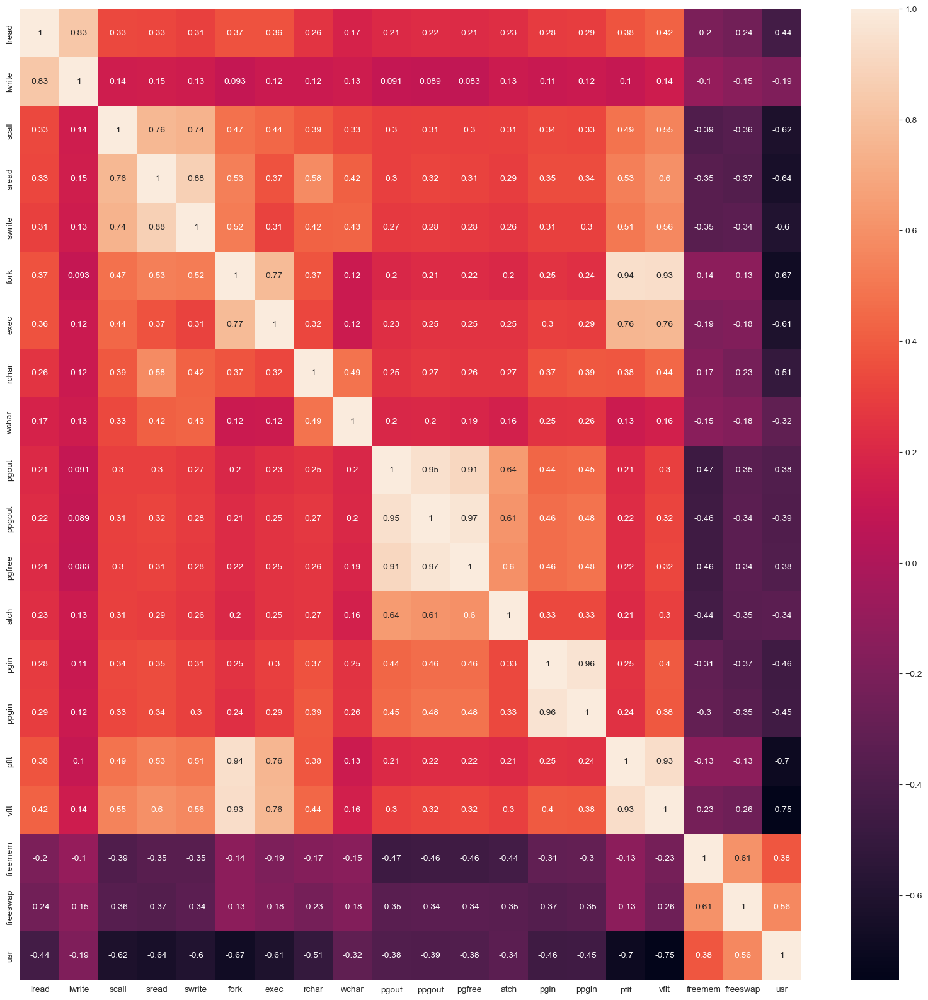

In [1200]:
plt.figure(figsize=(20,20))
sns.heatmap(df_corr, annot=True)

In [1201]:
df.columns

Index(['lread', 'lwrite', 'scall', 'sread', 'swrite', 'fork', 'exec', 'rchar',
       'wchar', 'pgout', 'ppgout', 'pgfree', 'atch', 'pgin', 'ppgin', 'pflt',
       'vflt', 'freemem', 'freeswap', 'usr'],
      dtype='object')

In [1202]:
#we will now split the data 
# independent variables
X=df[['lread', 'lwrite', 'scall', 'sread', 'swrite', 'fork', 'exec', 'rchar',
       'wchar', 'pgout', 'ppgout', 'pgfree', 'atch', 'pgin', 'ppgin', 'pflt',
       'vflt', 'freemem', 'freeswap']]
# dependent variable
y=df['usr']

In [1203]:
import statsmodels.api as sm

In [1204]:
# add the intercept to data
X = sm.add_constant(X)

In [1205]:
#split X and y into train and test sets in a 70:30 ratio.

In [1206]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

In [1207]:
print(X_train.head())

      const  lread  lwrite   scall  sread  swrite  fork  exec     rchar  \
694     1.0    1.0     1.0  1345.0  223.0   192.0   0.6   0.6  198703.0   
5535    1.0    1.0     1.0  1429.0   87.0    67.0   0.2   0.2    7163.0   
4244    1.0   47.0    25.0  3273.0  225.0   180.0   0.6   0.4   83246.0   
2472    1.0   13.0     8.0  4349.0  300.0   191.0   2.8   3.0   96009.0   
7052    1.0   17.0    23.0   225.0   13.0    13.0   0.4   1.6   17132.0   

           wchar  pgout  ppgout  pgfree  atch  pgin  ppgin    pflt    vflt  \
694   230625.875   0.60    6.20   12.50   1.5  3.80   7.40   28.20   56.60   
5535   24842.000   0.00    0.00    0.00   0.0  1.60   1.60   15.77   30.74   
4244   53705.000   5.39    7.19    7.19   1.5  3.99   4.59   59.88   74.05   
2472   70467.000   0.00    0.00    0.00   0.0  2.80   3.20  129.00  236.80   
7052   12514.000   0.00    0.00    0.00   0.0  0.00   0.00   19.80   23.80   

      freemem   freeswap  
694     121.0  1375446.0  
5535   1476.0  1021541.0  

In [1208]:
print(X_test.head())

      const  lread  lwrite   scall  sread  swrite  fork  exec     rchar  \
3894    1.0   27.0    25.0  1252.0   53.0   118.0   0.2   0.2   26592.0   
4276    1.0    1.0     0.0   996.0   85.0    55.0   0.4   0.4   16667.0   
3414    1.0    9.0     7.0  1530.0  247.0   135.0   0.4   0.4   14513.0   
4165    1.0   32.0     4.0  3243.0  182.0   140.0   4.9   5.6  337517.0   
7385    1.0   16.0     3.0  5017.0  259.0   249.0   2.8   1.4   73537.0   

           wchar  pgout  ppgout  pgfree  atch  pgin  ppgin    pflt    vflt  \
3894   54394.000    0.0     0.0     0.0   0.0   0.4    0.6   19.44   20.04   
4276   36431.000    0.0     0.0     0.0   0.0   1.0    1.4   35.53   52.10   
3414   61905.000    6.0    10.5    12.5   1.5  14.8   18.4   26.80  186.20   
4165   94832.000    0.8     1.0     1.0   1.4   4.6    7.0  250.60  420.20   
7385  230625.875    0.0     0.0     0.0   0.0   5.6    5.8  142.80  276.20   

       freemem   freeswap  
3894  4659.125  1875466.0  
4276  2979.000  1010114.

In [1209]:
#fitting the linear model
fitmod= sm.OLS(y_train,X_train)
fitres=fitmod.fit()

In [1210]:
print(fitres.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.790
Model:                            OLS   Adj. R-squared:                  0.790
Method:                 Least Squares   F-statistic:                     1133.
Date:                Sun, 14 Jan 2024   Prob (F-statistic):               0.00
Time:                        06:46:46   Log-Likelihood:                -16738.
No. Observations:                5734   AIC:                         3.352e+04
Df Residuals:                    5714   BIC:                         3.365e+04
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         85.5495      0.300    285.117      0.0

In [1211]:
# Rsquare

In [1212]:
# check the varience inflation factor of the predictors
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif_series = pd.Series(
  [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
  index=X_train.columns,
)
print('VIF values: \n\n{}\n'.format(vif_series))

VIF values: 

const       25.601099
lread        5.298513
lwrite       4.303179
scall        2.929695
sread        6.420121
swrite       5.597129
fork        13.031712
exec         3.240493
rchar        2.110885
wchar        1.555099
pgout       11.348082
ppgout      29.394226
pgfree      16.486831
atch         1.874624
pgin        13.808466
ppgin       13.947912
pflt        12.001459
vflt        15.970315
freemem      1.945776
freeswap     1.828205
dtype: float64



In [1213]:
#drop multicollinear columns one by one and observe the effect on our model

In [1214]:
X_train2 =X_train.drop(["ppgout"],axis=1)
fitmod_1=sm.OLS(y_train, X_train2)
fitres_1=fitmod_1.fit()
print("R-squared:",
    np.round(fitres_1.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_1.rsquared,5),)

R-squared: 0.79 
Adjusted R-squared: 0.79022


In [1215]:
#Conclusion : On dropping 'ppgout', adj. R-squared almost remains the same.

In [1216]:
X_train3 = X_train.drop(["pgfree"], axis=1)
fitmod_2 = sm.OLS(y_train, X_train3)
fitres_2 = fitmod_2.fit()
print("R-squared:",
    np.round(fitres_2.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_2.rsquared_adj, 3),)

R-squared: 0.79 
Adjusted R-squared: 0.79


In [1217]:
#conclusion :  On dropping 'pgfree', adj. R-squared almost remains the same.

In [1218]:
X_train4 = X_train.drop(["vflt"], axis=1)
fitmod_3 = sm.OLS(y_train, X_train4)
fitres_3 = fitmod_3.fit()
print("R-squared:", 
    np.round(fitres_3.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_3.rsquared_adj, 3),)

R-squared: 0.79 
Adjusted R-squared: 0.789


In [1219]:
#conclusion : On dropping 'vflt', adj. R-squared decresed by 0.001


In [1220]:
X_train5 = X_train.drop(["ppgin"], axis=1)
fitmod_4 = sm.OLS(y_train, X_train5)
fitres_4 = fitmod_4.fit()
print("R-squared:", 
    np.round(fitres_4.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_4.rsquared_adj, 3),)

R-squared: 0.79 
Adjusted R-squared: 0.789


In [1221]:
#conclusion: On dropping 'ppgin', adj. R-squared decresed by 0.001

In [1222]:
X_train6 = X_train.drop(["pgin"], axis=1)
fitmod_5 = sm.OLS(y_train, X_train6)
fitres_5 = fitmod_5.fit()
print("R-squared:", 
    np.round(fitres_5.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_5.rsquared_adj, 3),)

R-squared: 0.79 
Adjusted R-squared: 0.79


In [1223]:
#Conclusion : On dropping 'pgin', adj. R-squared almost remains the same.

In [1224]:
X_train7 = X_train.drop(["fork"], axis=1)
fitmod_6 = sm.OLS(y_train, X_train7)
fitres_6 = fitmod_6.fit()
print("R-squared:", 
    np.round(fitres_6.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_6.rsquared_adj, 3),)

R-squared: 0.79 
Adjusted R-squared: 0.79


In [1225]:
#Conclusion : On dropping "fork", adj. R-squared almost remains the same.

In [1226]:
X_train8 = X_train.drop(["pflt"], axis=1)
fitmod_7 = sm.OLS(y_train, X_train8)
fitres_7 = fitmod_7.fit()
print("R-squared:", 
    np.round(fitres_7.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_7.rsquared_adj, 3),)

R-squared: 0.78 
Adjusted R-squared: 0.779


In [1227]:
#Conclusion : On dropping 'pflt', adj. R-squared decreases by 0.011
#sharp decline indicates that 'pflt' is an important predictor and should not be removed 

In [1228]:
X_train9 = X_train.drop(["pgout"], axis=1)
fitmod_8 = sm.OLS(y_train, X_train9)
fitres_8 = fitmod_8.fit()
print("R-squared:", 
    np.round(fitres_8.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_8.rsquared_adj, 3),)

R-squared: 0.79 
Adjusted R-squared: 0.789


In [1229]:
#Conclusion : On dropping 'pgout', adj. R-squared decresed by 0.001

In [1230]:
X_train10 = X_train.drop(["sread"], axis=1)
fitmod_9 = sm.OLS(y_train, X_train10)
fitres_9 = fitmod_9.fit()
print("R-squared:", 
    np.round(fitres_8.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_8.rsquared_adj, 3),)

R-squared: 0.79 
Adjusted R-squared: 0.789


In [1231]:
#conclusion : On dropping 'sread', adj. R-squared decresed by 0.001

In [1232]:
X_train = X_train.drop(["ppgout"], axis=1)

In conclusion, observing that the adjusted R-squared remains unaffected upon removing the 'ppgout' column, and considering its substantial influence on the variance, we opt to exclude it from the training set.

In [1233]:
fitmod_10 = sm.OLS(y_train, X_train)
fitres_10 = fitmod_10.fit()
print(fitres_10.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.790
Model:                            OLS   Adj. R-squared:                  0.790
Method:                 Least Squares   F-statistic:                     1196.
Date:                Sun, 14 Jan 2024   Prob (F-statistic):               0.00
Time:                        06:46:46   Log-Likelihood:                -16739.
No. Observations:                5734   AIC:                         3.352e+04
Df Residuals:                    5715   BIC:                         3.364e+04
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         85.5676      0.299    286.179      0.0

In [1234]:
#squared value tells us that our model can explain 79.0% variance in the training set.

In [1235]:
#check for multicollinearity

In [1236]:
vif_series1 = pd.Series([variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
    index=X_train.columns,)
print("VIF values: \n\n{}\n".format(vif_series1))

VIF values: 

const       25.424423
lread        5.298433
lwrite       4.303148
scall        2.929554
sread        6.420086
swrite       5.597020
fork        13.023854
exec         3.238358
rchar        2.110869
wchar        1.551973
pgout        6.430968
pgfree       6.171219
atch         1.874301
pgin        13.782952
ppgin       13.894353
pflt        12.001459
vflt        15.966065
freemem      1.943526
freeswap     1.825361
dtype: float64



In [1237]:
X_train11 = X_train.drop(["vflt"], axis=1)
fitmod_11 = sm.OLS(y_train, X_train11)
fitres_11 = fitmod_11.fit()
print(
    "R-squared:", 
    np.round(fitres_11.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_11.rsquared_adj, 3),
)

R-squared: 0.79 
Adjusted R-squared: 0.789


In [1238]:
#conclusion : : On dropping 'vflt', adj. R-squared decresed by 0.001

In [1239]:
X_train12 = X_train.drop(["ppgin"], axis=1)
fitmod_12 = sm.OLS(y_train, X_train12)
fitres_12 = fitmod_12.fit()
print("R-squared:", 
    np.round(fitres_12.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_12.rsquared_adj, 3),)

R-squared: 0.79 
Adjusted R-squared: 0.789


In [1240]:
X_train13 = X_train.drop(["pgin"], axis=1)
fitmod_13 = sm.OLS(y_train, X_train13)
fitres_13 = fitmod_13.fit()
print("R-squared:", 
    np.round(fitres_13.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_13.rsquared_adj, 3),)

R-squared: 0.79 
Adjusted R-squared: 0.79


In [1241]:
X_train14 = X_train.drop(["fork"], axis=1)
fitmod_14 = sm.OLS(y_train, X_train14)
fitres_14 = fitmod_14.fit()
print("R-squared:", 
    np.round(fitres_14.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_14.rsquared_adj, 3),)

R-squared: 0.79 
Adjusted R-squared: 0.79


In [1242]:
X_train15 = X_train.drop(["pflt"], axis=1)
fitmod_15 = sm.OLS(y_train, X_train15)
fitres_15 = fitmod_15.fit()
print("R-squared:", 
    np.round(fitres_15.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_15.rsquared_adj, 3),)

R-squared: 0.78 
Adjusted R-squared: 0.779


In [1243]:
#In conclusion, the removal of 'pflt' led to a substantial 0.011 decrease in the adjusted R-squared. This pronounced reduction underscores the significance of 'pflt' as a crucial predictor, strongly advising against its exclusion from the model.

In [1244]:
X_train16 = X_train.drop(["sread"], axis=1)
fitmod_16 = sm.OLS(y_train, X_train16)
fitres_16 = fitmod_16.fit()
print("R-squared:", 
    np.round(fitres_16.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_16.rsquared_adj, 3),)

R-squared: 0.79 
Adjusted R-squared: 0.79


In [1245]:
X_train17 = X_train.drop(["sread"], axis=1)
fitmod_17 = sm.OLS(y_train, X_train17)
fitres_17 = fitmod_17.fit()
print("R-squared:", 
    np.round(fitres_17.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_17.rsquared_adj, 3),)

R-squared: 0.79 
Adjusted R-squared: 0.79


In [1246]:
X_train = X_train.drop(["pgin"], axis=1)

In [1247]:
#In conclusion, given the absence of any impact on the adjusted R-squared after removing the 'pgin' column, and considering its high variance influence factor, the decision is made to exclude it from the training set.

In [1248]:
fitmod_18 = sm.OLS(y_train, X_train)
fitres_18 = fitmod_18.fit()
print(fitres_18.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.790
Model:                            OLS   Adj. R-squared:                  0.790
Method:                 Least Squares   F-statistic:                     1266.
Date:                Sun, 14 Jan 2024   Prob (F-statistic):               0.00
Time:                        06:46:46   Log-Likelihood:                -16739.
No. Observations:                5734   AIC:                         3.351e+04
Df Residuals:                    5716   BIC:                         3.363e+04
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         85.5825      0.298    287.156      0.0

In [1249]:
#inference: The R-squared value indicates that our model can account for 79.0% of the variance within the training set.

In [1250]:
#check for multicollinearity

In [1251]:
vif_series2 = pd.Series([variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
    index=X_train.columns,)
print("VIF values: \n\n{}\n".format(vif_series2))

VIF values: 

const       25.263079
lread        5.295815
lwrite       4.303110
scall        2.927766
sread        6.418812
swrite       5.596559
fork        13.008265
exec         3.235774
rchar        2.099560
wchar        1.550961
pgout        6.422354
pgfree       6.155198
atch         1.874263
ppgin        1.722709
pflt        11.952041
vflt        15.755601
freemem      1.943522
freeswap     1.817817
dtype: float64



In [1252]:
#Let's eliminate multicollinear columns step by step and assess their impact on our predictive model.
X_train18 = X_train.drop(["vflt"], axis=1)
fitmod_19 = sm.OLS(y_train, X_train18)
fitres_19 = fitmod_19.fit()
print("R-squared:", 
    np.round(fitres_19.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_19.rsquared_adj, 3),)

R-squared: 0.79 
Adjusted R-squared: 0.789


In [1253]:
# R-squared decresed by 0.001

In [1254]:
X_train19 = X_train.drop(["fork"], axis=1)
fitmod_20 = sm.OLS(y_train, X_train19)
fitres_20 = fitmod_20.fit()
print("R-squared:", 
    np.round(fitres_20.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_20.rsquared_adj, 3),)

R-squared: 0.79 
Adjusted R-squared: 0.79


In [1255]:
# R-squared almost remains the same.

In [1256]:
X_train20 = X_train.drop(["pflt"], axis=1)
fitmod_21 = sm.OLS(y_train, X_train20)
fitres_21 = fitmod_21.fit()
print("R-squared:", 
    np.round(fitres_21.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_21.rsquared_adj, 3),)

R-squared: 0.78 
Adjusted R-squared: 0.779


In [1257]:
#R-squared decreased by 0.011

In [1258]:
X_train21 = X_train.drop(["sread"], axis=1)
fitmod_22 = sm.OLS(y_train, X_train21)
fitres_22 = fitmod_22.fit()
print("R-squared:", 
    np.round(fitres_22.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_22.rsquared_adj, 3),)

R-squared: 0.79 
Adjusted R-squared: 0.79


In [1259]:
#R-squared almost remains the same.

In [1260]:
X_train = X_train.drop(["fork"], axis=1)

In [1261]:
fitmod_23 = sm.OLS(y_train, X_train)
fitres_23 = fitmod_23.fit()
print(fitres_23.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.790
Model:                            OLS   Adj. R-squared:                  0.790
Method:                 Least Squares   F-statistic:                     1346.
Date:                Sun, 14 Jan 2024   Prob (F-statistic):               0.00
Time:                        06:46:46   Log-Likelihood:                -16739.
No. Observations:                5734   AIC:                         3.351e+04
Df Residuals:                    5717   BIC:                         3.363e+04
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         85.5665      0.296    289.400      0.0

In [1262]:
#check  multicollinearity in data 


In [1263]:
vif_series3 = pd.Series(
    [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
    index=X_train.columns,)
print("VIF values: \n\n{}\n".format(vif_series3))

VIF values: 

const       24.867190
lread        5.291314
lwrite       4.292316
scall        2.881265
sread        6.401983
swrite       5.424154
exec         2.976082
rchar        2.099430
wchar        1.550783
pgout        6.422127
pgfree       6.153589
atch         1.868078
ppgin        1.662799
pflt        10.263511
vflt        12.208194
freemem      1.943497
freeswap     1.794067
dtype: float64



In [1264]:
X_train22 = X_train.drop(["vflt"], axis=1)
fitmod_24 = sm.OLS(y_train, X_train21)
fitres_24 = fitmod_24.fit()
print("R-squared:", 
    np.round(fitres_24.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_24.rsquared_adj, 3),)

R-squared: 0.79 
Adjusted R-squared: 0.79


In [1265]:
X_train23 = X_train.drop(["pflt"], axis=1)
fitmod_25 = sm.OLS(y_train, X_train23)
fitres_25 = fitmod_25.fit()
print("R-squared:", 
    np.round(fitres_25.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_25.rsquared_adj, 3),)

R-squared: 0.778 
Adjusted R-squared: 0.778


In [1266]:
X_train24 = X_train.drop(["pgout"], axis=1)
fitmod_26 = sm.OLS(y_train, X_train24)
fitres_26 = fitmod_26.fit()
print("R-squared:", 
    np.round(fitres_26.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_26.rsquared_adj, 3),)

R-squared: 0.789 
Adjusted R-squared: 0.789


In [1267]:
X_train25 = X_train.drop(["sread"], axis=1)
fitmod_27 = sm.OLS(y_train, X_train25)
fitres_27 = fitmod_27.fit()
print("R-squared:", 
    np.round(fitres_27.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_27.rsquared_adj, 3),)

R-squared: 0.79 
Adjusted R-squared: 0.79


In [1268]:
X_train26 = X_train.drop(["pgfree"], axis=1)
fitmod_28 = sm.OLS(y_train, X_train26)
fitres_28 = fitmod_28.fit()
print("R-squared:", 
    np.round(fitres_28.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_28.rsquared_adj, 3),)

R-squared: 0.79 
Adjusted R-squared: 0.79


In [1269]:
X_train27 = X_train.drop(["swrite"], axis=1)
fitmod_30 = sm.OLS(y_train, X_train27)
fitres_30 = fitmod_30.fit()
print("R-squared:", 
    np.round(fitres_30.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_30.rsquared_adj, 3),)

R-squared: 0.79 
Adjusted R-squared: 0.789


In [1270]:
X_train28 = X_train.drop(["lread"], axis=1)
fitmod_31 = sm.OLS(y_train, X_train28)
fitres_31 = fitmod_31.fit()
print("R-squared:", 
    np.round(fitres_31.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_31.rsquared_adj, 3),)

R-squared: 0.788 
Adjusted R-squared: 0.787


In [1271]:
X_train = X_train.drop(["vflt"], axis=1)

In [1272]:
fitmod_32 = sm.OLS(y_train, X_train)
fitres_32 = fitmod_32.fit()
print(fitres_32.summary())


                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.790
Model:                            OLS   Adj. R-squared:                  0.789
Method:                 Least Squares   F-statistic:                     1431.
Date:                Sun, 14 Jan 2024   Prob (F-statistic):               0.00
Time:                        06:46:46   Log-Likelihood:                -16747.
No. Observations:                5734   AIC:                         3.353e+04
Df Residuals:                    5718   BIC:                         3.363e+04
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         85.4656      0.295    289.795      0.0

In [1273]:
#check for multicollinearity

In [1274]:
vif_series4 = pd.Series([variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
    index=X_train.columns,
)
print("VIF values: \n\n{}\n".format(vif_series4))

VIF values: 

const       24.678799
lread        5.263308
lwrite       4.283585
scall        2.881082
sread        6.373377
swrite       5.389479
exec         2.852210
rchar        2.090954
wchar        1.520539
pgout        6.420218
pgfree       6.134764
atch         1.861635
ppgin        1.557223
pflt         3.458759
freemem      1.941502
freeswap     1.759406
dtype: float64



In [1275]:
X_train29 = X_train.drop(["pgout"], axis=1)
fitmod_33 = sm.OLS(y_train, X_train29)
fitres_33 = fitmod_33.fit()
print("R-squared:", 
    np.round(fitres_33.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_33.rsquared_adj, 3),)

R-squared: 0.789 
Adjusted R-squared: 0.788


In [1276]:
X_train30 = X_train.drop(["sread"], axis=1)
fitmod_34 = sm.OLS(y_train, X_train30)
fitres_34 = fitmod_34.fit()
print("R-squared:", 
    np.round(fitres_34.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_34.rsquared_adj, 3),)

R-squared: 0.79 
Adjusted R-squared: 0.789


In [1277]:
X_train31 = X_train.drop(["pgfree"], axis=1)
fitmod_35 = sm.OLS(y_train, X_train31)
fitres_35 = fitmod_35.fit()
print("R-squared:", 
    np.round(fitres_35.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_35.rsquared_adj, 3),)

R-squared: 0.79 
Adjusted R-squared: 0.789


In [1278]:
X_train32 = X_train.drop(["lread"], axis=1)
fitmod_36 = sm.OLS(y_train, X_train32)
fitres_36 = fitmod_36.fit()
print("R-squared:", 
    np.round(fitres_36.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_36.rsquared_adj, 3),)

R-squared: 0.787 
Adjusted R-squared: 0.786


In [1279]:
X_train = X_train.drop(["sread"], axis=1)

In [1280]:
fitmod_37 = sm.OLS(y_train, X_train)
fitres_37 = fitmod_37.fit()
print(fitres_37.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.790
Model:                            OLS   Adj. R-squared:                  0.789
Method:                 Least Squares   F-statistic:                     1533.
Date:                Sun, 14 Jan 2024   Prob (F-statistic):               0.00
Time:                        06:46:47   Log-Likelihood:                -16747.
No. Observations:                5734   AIC:                         3.352e+04
Df Residuals:                    5719   BIC:                         3.362e+04
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         85.4651      0.294    290.228      0.0

In [1281]:
vif_series5 = pd.Series(
    [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
    index=X_train.columns,
)
print("VIF values: \n\n{}\n".format(vif_series5))

VIF values: 

const       24.609318
lread        5.256025
lwrite       4.274448
scall        2.623304
swrite       3.013628
exec         2.845389
rchar        1.672692
wchar        1.507355
pgout        6.419560
pgfree       6.134003
atch         1.860335
ppgin        1.556204
pflt         3.437037
freemem      1.940946
freeswap     1.745925
dtype: float64



In [1282]:
X_train33 = X_train.drop(["pgout"], axis=1)
fitmod_38 = sm.OLS(y_train, X_train33)
fitres_38 = fitmod_38.fit()
print("R-squared:", 
    np.round(fitres_38.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_38.rsquared_adj, 3),)

R-squared: 0.789 
Adjusted R-squared: 0.788


In [1283]:
X_train34 = X_train.drop(["pgfree"], axis=1)
fitmod_39 = sm.OLS(y_train, X_train34)
fitres_39 = fitmod_39.fit()
print("R-squared:", 
    np.round(fitres_39.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_39.rsquared_adj, 3),)

R-squared: 0.79 
Adjusted R-squared: 0.789


In [1284]:
X_train35 = X_train.drop(["lread"], axis=1)
fitmod_40 = sm.OLS(y_train, X_train35)
fitres_40 = fitmod_40.fit()
print("R-squared:", 
    np.round(fitres_40.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_40.rsquared_adj, 3),)

R-squared: 0.787 
Adjusted R-squared: 0.786


In [1285]:
X_train = X_train.drop(["pgfree"], axis=1)

In [1286]:
fitmod_41 = sm.OLS(y_train, X_train)
fitres_41 = fitmod_41.fit()
print(fitres_41.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.790
Model:                            OLS   Adj. R-squared:                  0.789
Method:                 Least Squares   F-statistic:                     1651.
Date:                Sun, 14 Jan 2024   Prob (F-statistic):               0.00
Time:                        06:46:47   Log-Likelihood:                -16747.
No. Observations:                5734   AIC:                         3.352e+04
Df Residuals:                    5720   BIC:                         3.362e+04
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         85.4634      0.294    290.217      0.0

In [1287]:
#check muticollinearity 
vif_series6 = pd.Series(
    [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
    index=X_train.columns,)
print("VIF values: \n\n{}\n".format(vif_series6))

VIF values: 

const       24.608667
lread        5.252482
lwrite       4.269747
scall        2.620463
swrite       3.012179
exec         2.842593
rchar        1.672474
wchar        1.507075
pgout        2.031280
atch         1.859242
ppgin        1.517295
pflt         3.437026
freemem      1.929513
freeswap     1.744428
dtype: float64



In [1288]:
#droping 'lread' due to MC

X_train = X_train.drop(["lread"], axis=1)

In [1289]:
vif_series7 = pd.Series(
    [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
    index=X_train.columns,
)
print("VIF values: \n\n{}\n".format(vif_series7))

VIF values: 

const       24.607003
lwrite       1.051904
scall        2.610927
swrite       3.011508
exec         2.813506
rchar        1.672303
wchar        1.505525
pgout        2.031070
atch         1.858779
ppgin        1.465832
pflt         3.255423
freemem      1.928669
freeswap     1.739738
dtype: float64



In [1290]:
X_train = X_train.drop(["pflt"], axis=1)

In [1291]:
fitmod_42 = sm.OLS(y_train, X_train35)
fitres_42 = fitmod_42.fit()
print(fitres_42.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.787
Model:                            OLS   Adj. R-squared:                  0.786
Method:                 Least Squares   F-statistic:                     1625.
Date:                Sun, 14 Jan 2024   Prob (F-statistic):               0.00
Time:                        06:46:47   Log-Likelihood:                -16783.
No. Observations:                5734   AIC:                         3.359e+04
Df Residuals:                    5720   BIC:                         3.369e+04
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         85.4441      0.296    288.345      0.0

In [1292]:
#Conclusion: Following the removal of features responsible for significant multicollinearity and those deemed statistically insignificant, our model's performance has not experienced a substantial decline. This suggests that these variables lacked considerable predictive power in our model.

In [1293]:
vif_series8 = pd.Series(
    [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
    index=X_train.columns,
)
print("VIF values: \n\n{}\n".format(vif_series8))

VIF values: 

const       24.318585
lwrite       1.051894
scall        2.601101
swrite       2.521669
exec         1.368012
rchar        1.623734
wchar        1.438804
pgout        2.027035
atch         1.858638
ppgin        1.463216
freemem      1.911325
freeswap     1.727889
dtype: float64



In [1294]:
#VIF for all features is <3

In [1295]:
df_pr = pd.DataFrame()

df_pr["Actual Values"] = y_train.values.flatten()  # actual values
df_pr["Fitted Values"] = fitres_42.fittedvalues.values  # predicted values
df_pr["Residuals"] = fitres_42.resid.values  # residuals

df_pr.head()

,Actual Values,Fitted Values,Residuals
0,91.0,91.765169,-0.765169
1,94.0,91.261125,2.738875
2,61.5,76.430666,-14.930666
3,83.0,81.272261,1.727739
4,94.0,97.101512,-3.101512


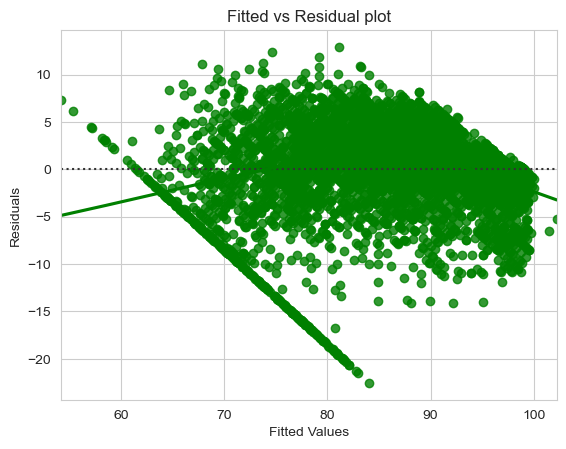

In [1296]:
#Checking linerarity and independence
sns.set_style("whitegrid")
sns.residplot(
    data=df_pred, x="Fitted Values", y="Residuals", color="green", lowess=True)
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Fitted vs Residual plot")
plt.show()

In [1297]:
# It's noted that the pattern has slightly diminished, and the data points now appear to be more randomly distributed.

In [1298]:
X_train35.columns

Index(['const', 'lwrite', 'scall', 'swrite', 'exec', 'rchar', 'wchar', 'pgout',
       'pgfree', 'atch', 'ppgin', 'pflt', 'freemem', 'freeswap'],
      dtype='object')

<Figure size 1200x1200 with 0 Axes>

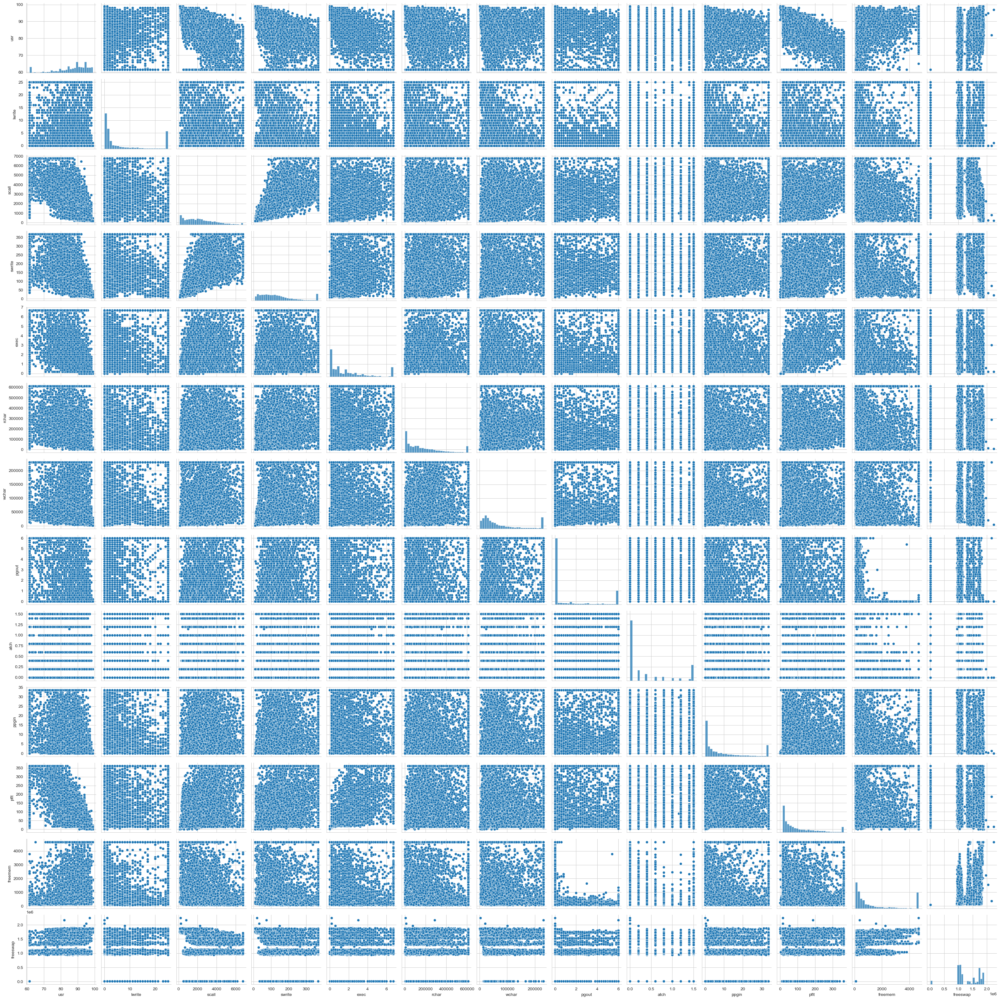

In [1299]:
#lets check the distribution
plt.figure(figsize=(12,12))
sns.pairplot(df[['usr', 'lwrite', 'scall', 'swrite', 'exec', 'rchar', 'wchar', 'pgout',
       'atch', 'ppgin', 'pflt', 'freemem', 'freeswap']])
plt.show()

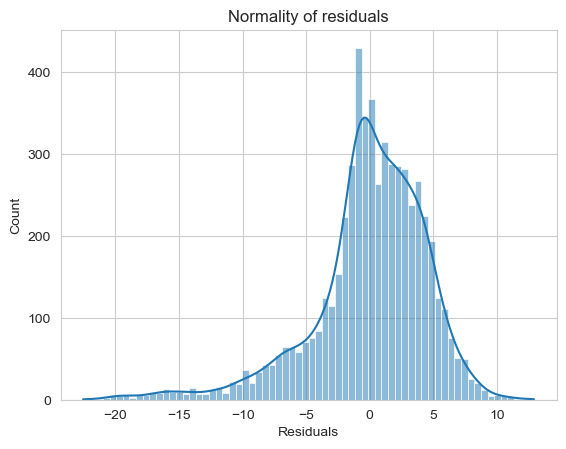

In [1300]:
sns.histplot(df_pred["Residuals"], kde=True)
plt.title("Normality of residuals")
plt.show()

#Observation: The residual terms demonstrate a normal distribution. A visual examination of the QQ plot of residuals can validate the normality assumption,
where the normal probability plot should closely align with a straight line.

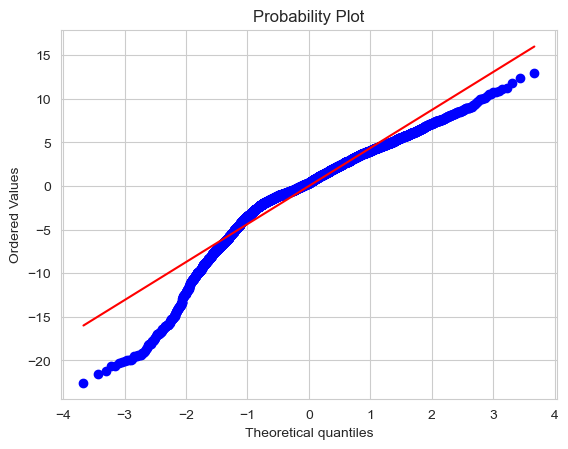

In [1301]:
import pylab
import scipy.stats as stats

stats.probplot(df_pred["Residuals"], dist="norm", plot=pylab)
plt.show()


In [1302]:
#Partially the points are lying on the straight line in QQ plot

In [1303]:
stats.shapiro(df_pred["Residuals"])

ShapiroResult(statistic=0.9300408959388733, pvalue=1.401298464324817e-45)

In [1304]:
#HOMOSCEDASTICITY
import statsmodels.stats.api as sms
from statsmodels.compat import lzip

In [1305]:
name = ["F statistic", "p-value"]
test = sms.het_goldfeldquandt(df_pred["Residuals"], X_train8)
lzip(name, test)

[('F statistic', 1.1299923459713648), ('p-value', 0.0005576651863864631)]

assumptions of linear regression are now satisfied.

In [1306]:
print(fitres_42.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.787
Model:                            OLS   Adj. R-squared:                  0.786
Method:                 Least Squares   F-statistic:                     1625.
Date:                Sun, 14 Jan 2024   Prob (F-statistic):               0.00
Time:                        06:48:04   Log-Likelihood:                -16783.
No. Observations:                5734   AIC:                         3.359e+04
Df Residuals:                    5720   BIC:                         3.369e+04
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         85.4441      0.296    288.345      0.0

In [1307]:
#linear regression equation
fitres_42.params


const       85.444051
lwrite      -0.035432
scall       -0.000779
swrite      -0.005936
exec        -0.408362
rchar       -0.000006
wchar       -0.000006
pgout       -0.352144
pgfree       0.027503
atch         0.621658
ppgin       -0.069885
pflt        -0.041413
freemem     -0.000400
freeswap     0.000009
dtype: float64

In [1308]:
Equation = "usr ="
print(Equation, end=" ")
for i in range(len(X_train35.columns)):
    if i == 0:
        print(fitres_42.params[i], "+", end=" ")
    elif i != len(X_train35.columns) - 1:
        print(
            fitres_42.params[i],
            "* (",
            X_train35.columns[i],
            ")",
            "+",
            end="  ",
        )
    else:
        print(fitres_42.params[i], "* (", X_train35.columns[i], ")")

usr = 85.44405142467511 + -0.035431681356878006 * ( lwrite ) +  -0.0007789166996726056 * ( scall ) +  -0.0059364238127426 * ( swrite ) +  -0.408362100281623 * ( exec ) +  -6.000393832825783e-06 * ( rchar ) +  -6.376410814972524e-06 * ( wchar ) +  -0.35214422917288685 * ( pgout ) +  0.02750333410757566 * ( pgfree ) +  0.6216576279548014 * ( atch ) +  -0.06988532485141626 * ( ppgin ) +  -0.04141258260531031 * ( pflt ) +  -0.0004000185573245753 * ( freemem ) +  8.81187709338839e-06 * ( freeswap )


In [1309]:
#lets use the model for making predictions on the test data.

In [1310]:

X_train35.columns

Index(['const', 'lwrite', 'scall', 'swrite', 'exec', 'rchar', 'wchar', 'pgout',
       'pgfree', 'atch', 'ppgin', 'pflt', 'freemem', 'freeswap'],
      dtype='object')

In [1311]:
X_test.columns

Index(['const', 'lread', 'lwrite', 'scall', 'sread', 'swrite', 'fork', 'exec',
       'rchar', 'wchar', 'pgout', 'ppgout', 'pgfree', 'atch', 'pgin', 'ppgin',
       'pflt', 'vflt', 'freemem', 'freeswap'],
      dtype='object')

In [1312]:
X_test2 = X_test.drop(
    ["lread", "sread", "fork","ppgout","pgin","vflt"], axis=1)

In [1313]:
#predication on test set 
y_pred = fitres_42.predict(X_test2)

In [1314]:
rmse1 = np.sqrt(mean_squared_error(y_train, df_pred["Fitted Values"]))
rmse1

4.517865444540217

In [1315]:
# let's check the RMSE on the test data
rmse2 = np.sqrt(mean_squared_error(y_test, y_pred))
rmse2

4.789314038671895

In [1316]:
# let's check the MAE on the train data
mae1 = mean_absolute_error(y_train, df_pred["Fitted Values"])
mae1

3.281552846836182

In [1317]:
mae2 = mean_absolute_error(y_test, y_pred)
mae2

3.406365896205417

Observation: The comparable RMSE values on both the train and test sets suggest that our model isn't encountering overfitting issues. The MAE indicates that our current model can predict 'mpg' within a mean error of the test data. Therefore, we can confidently conclude that the "fitres_42" model is suitable for both prediction and inference purposes.

##PROBLEM 2

In your role as a statistician at the Republic of Indonesia Ministry of Health, you have been entrusted with a dataset containing information from a Contraceptive Prevalence Survey. This dataset encompasses data from 1473 married females who were either not pregnant or were uncertain of their pregnancy status during the survey.

Your task involves predicting whether these women opt for a contraceptive method of choice. This prediction will be based on a comprehensive analysis of their demographic and socio-economic attributes.

In [1318]:
# import the libraries
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt 
import seaborn as sns  
%matplotlib inline
from sklearn.model_selection import train_test_split
import scipy.stats as stats  
from scipy.stats import norm
from scipy.stats import zscore
from scipy.stats import   ttest_1samp , ttest_ind
from statsmodels.formula.api import ols     
from sklearn.metrics import mean_absolute_error, mean_squared_error
from statsmodels.stats.anova import _get_covariance,anova_lm 
import statsmodels.stats.api as sm
from factor_analyzer import FactorAnalyzer # Perform statistical tests before PCA 
import warnings
warnings.filterwarnings("ignore")



In [1319]:
df2 = pd.read_excel("Contraceptive_method_dataset.xlsx")
df2.head()

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
0,24.0,Primary,Secondary,3.0,Scientology,No,2,High,Exposed,No
1,45.0,Uneducated,Secondary,10.0,Scientology,No,3,Very High,Exposed,No
2,43.0,Primary,Secondary,7.0,Scientology,No,3,Very High,Exposed,No
3,42.0,Secondary,Primary,9.0,Scientology,No,3,High,Exposed,No
4,36.0,Secondary,Secondary,8.0,Scientology,No,3,Low,Exposed,No


In [1320]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1473 entries, 0 to 1472
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Wife_age                   1402 non-null   float64
 1   Wife_ education            1473 non-null   object 
 2   Husband_education          1473 non-null   object 
 3   No_of_children_born        1452 non-null   float64
 4   Wife_religion              1473 non-null   object 
 5   Wife_Working               1473 non-null   object 
 6   Husband_Occupation         1473 non-null   int64  
 7   Standard_of_living_index   1473 non-null   object 
 8   Media_exposure             1473 non-null   object 
 9   Contraceptive_method_used  1473 non-null   object 
dtypes: float64(2), int64(1), object(7)
memory usage: 115.2+ KB


In [1321]:
df2.describe()

,Wife_age,No_of_children_born,Husband_Occupation
count,1402.000000,1452.000000,1473.000000
mean,32.606277,3.254132,2.137814
std,8.274927,2.365212,0.864857
min,16.000000,0.000000,1.000000
25%,26.000000,1.000000,1.000000
50%,32.000000,3.000000,2.000000
75%,39.000000,4.000000,3.000000
max,49.000000,16.000000,4.000000


In [1322]:
df2.shape

(1473, 10)

In [1323]:
df2.isnull().sum()

Wife_age                     71
Wife_ education               0
Husband_education             0
No_of_children_born          21
Wife_religion                 0
Wife_Working                  0
Husband_Occupation            0
Standard_of_living_index      0
Media_exposure                0
Contraceptive_method_used     0
dtype: int64

In [1324]:
df2['Wife_age'] = df2['Wife_age'].fillna(df2['Wife_age'].median())
df2['No_of_children_born'] = df2['No_of_children_born'].fillna(df2['No_of_children_born'].median())

In [1325]:
df2['No_of_children_born'] = df2['No_of_children_born'].replace(8.5,9)

In [1326]:
df2.isnull().sum()

Wife_age                     0
Wife_ education              0
Husband_education            0
No_of_children_born          0
Wife_religion                0
Wife_Working                 0
Husband_Occupation           0
Standard_of_living_index     0
Media_exposure               0
Contraceptive_method_used    0
dtype: int64

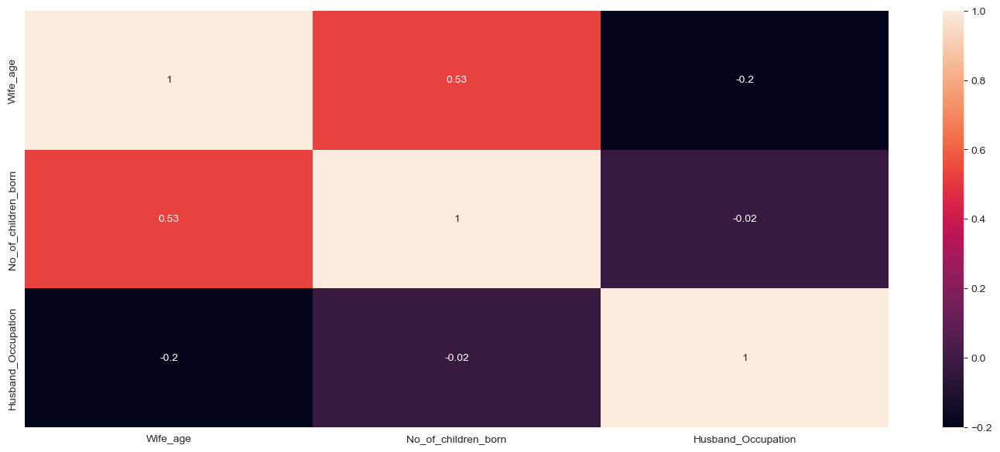

In [1327]:
#lets check the correaltion 
plt.figure(figsize=(18,7))
sns.heatmap(df2.corr(),annot=True)
plt.show()

In [1328]:
#there is no visible correaltion

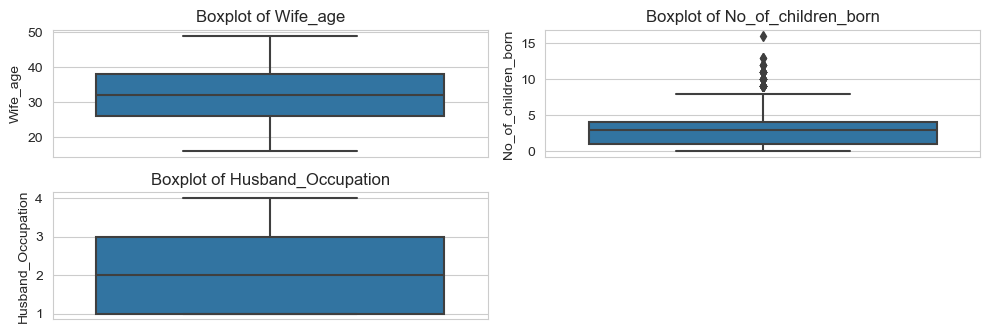

In [1329]:
#check for outliers 
col=df2.select_dtypes(include=['int64','float64']).columns
plt.figure(figsize=(10,18))
for i in range(len(col)):
    plt.subplot(11,2,i+1)
    sns.boxplot(y=df2[col[i]]);
    plt.title('Boxplot of {}'.format(col[i]))
    plt.tight_layout();

In [1330]:
#there are outliers in No of children born and we need to remove them


In [1331]:
def remove_outlier(col):
    sorted(col)
    Q1,Q3=np.percentile(col,[25,75])
    IQR=Q3-Q1
    lower_range= Q1-(1.5 * IQR)
    upper_range= Q3+(1.5 * IQR)
    return lower_range, upper_range

In [1332]:
for column in col:
    lr,ur=remove_outlier(df2[column])
    df2[column]=np.where(df2[column]>ur,ur,df2[column])
    df2[column]=np.where(df2[column]<lr,lr,df2[column])

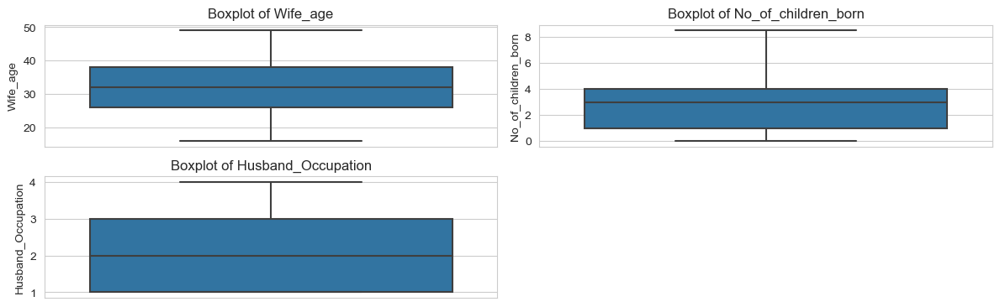

In [1333]:
plt.figure(figsize=(12,20))
for i in range(len(col)):
    plt.subplot(11,2,i+1)
    sns.boxplot(y=df2[col[i]]);
    plt.title('Boxplot of {}'.format(col[i]))
    plt.tight_layout();

In [1334]:
cat_col = df2.select_dtypes(include=['object']).columns

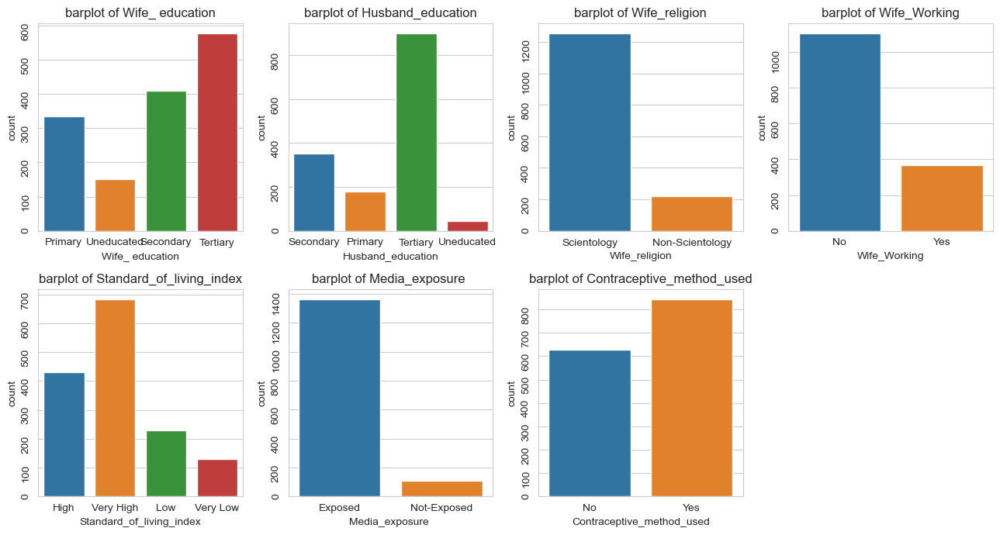

In [1335]:
plt.figure(figsize=(13,7))
for i in range(len(cat_col)):
    plt.subplot(2,4,i+1)
    sns.countplot(x=df2[cat_col[i]])
    plt.title('barplot of {}'.format(cat_col[i]))
    plt.yticks(rotation=90)
    plt.tight_layout()

In [1336]:
df2.columns

Index(['Wife_age', 'Wife_ education', 'Husband_education',
       'No_of_children_born', 'Wife_religion', 'Wife_Working',
       'Husband_Occupation', 'Standard_of_living_index', 'Media_exposure ',
       'Contraceptive_method_used'],
      dtype='object')

<Axes: xlabel='No_of_children_born', ylabel='Wife_age'>

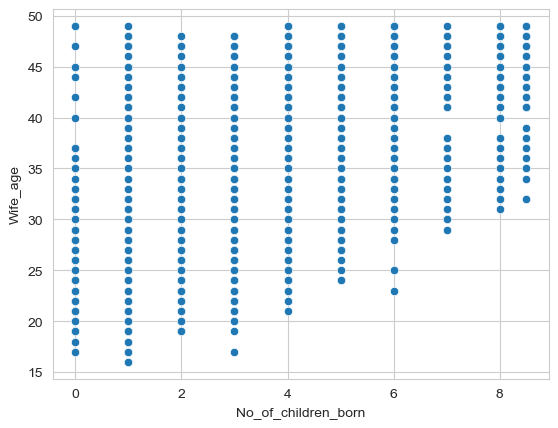

In [1337]:
sns.scatterplot(x=df2['No_of_children_born'],y=df2['Wife_age'])

Text(0.5, 1.0, 'Contraceptive_method_used vs Standard_of_living')

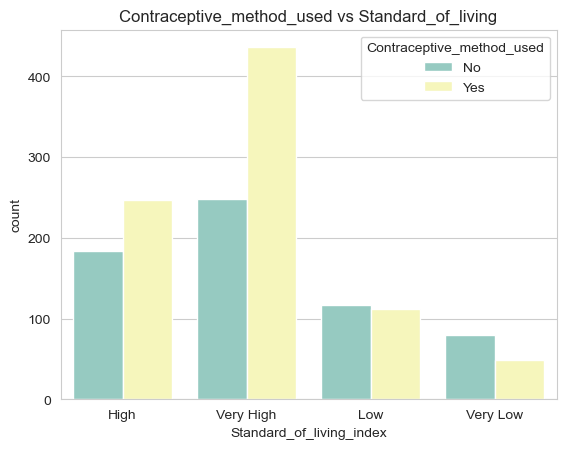

In [1338]:
sns.countplot(hue=df2['Contraceptive_method_used'],x=df2['Standard_of_living_index'],palette="Set3")
plt.title('Contraceptive_method_used vs Standard_of_living')

Text(0.5, 1.0, 'Standard_of_living vs Husband_education')

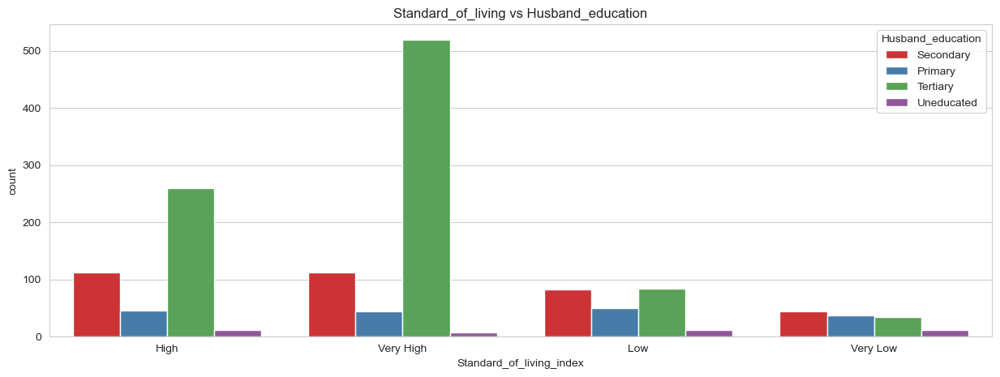

In [1339]:
plt.figure(figsize=(15,5))
sns.countplot(x=df2['Standard_of_living_index'],hue=df2['Husband_education'],palette="Set1")
plt.title('Standard_of_living vs Husband_education')

In [1340]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1473 entries, 0 to 1472
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Wife_age                   1473 non-null   float64
 1   Wife_ education            1473 non-null   object 
 2   Husband_education          1473 non-null   object 
 3   No_of_children_born        1473 non-null   float64
 4   Wife_religion              1473 non-null   object 
 5   Wife_Working               1473 non-null   object 
 6   Husband_Occupation         1473 non-null   float64
 7   Standard_of_living_index   1473 non-null   object 
 8   Media_exposure             1473 non-null   object 
 9   Contraceptive_method_used  1473 non-null   object 
dtypes: float64(3), object(7)
memory usage: 115.2+ KB


Text(0.5, 1.0, 'No_of_children_born vs Contraceptive_method_used')

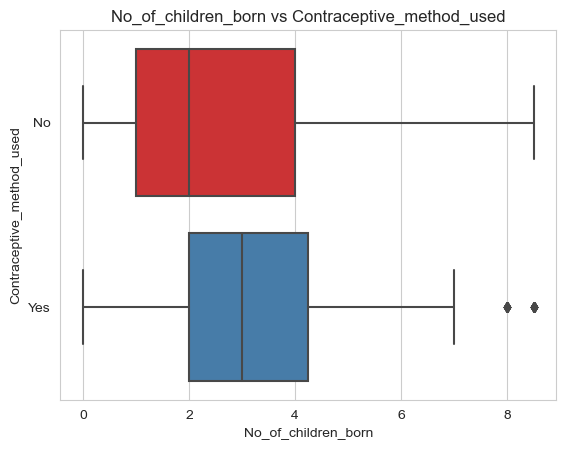

In [1341]:
sns.boxplot(x=df2['No_of_children_born'],y=df2['Contraceptive_method_used'],palette="Set1")
plt.title('No_of_children_born vs Contraceptive_method_used')

Text(0.5, 1.0, 'Contraceptive_method_used vs Standard_of_living')

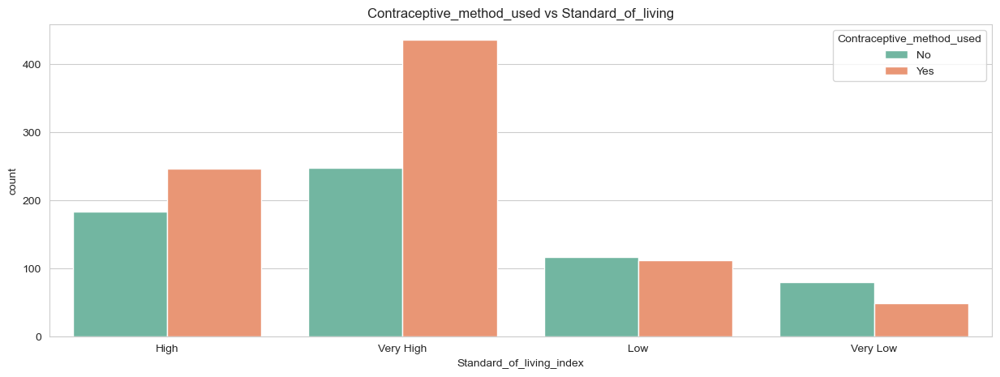

In [1342]:
plt.figure(figsize=(15,5))
sns.countplot(hue=df2['Contraceptive_method_used'],x=df2['Standard_of_living_index'],palette="Set2")
plt.title('Contraceptive_method_used vs Standard_of_living')

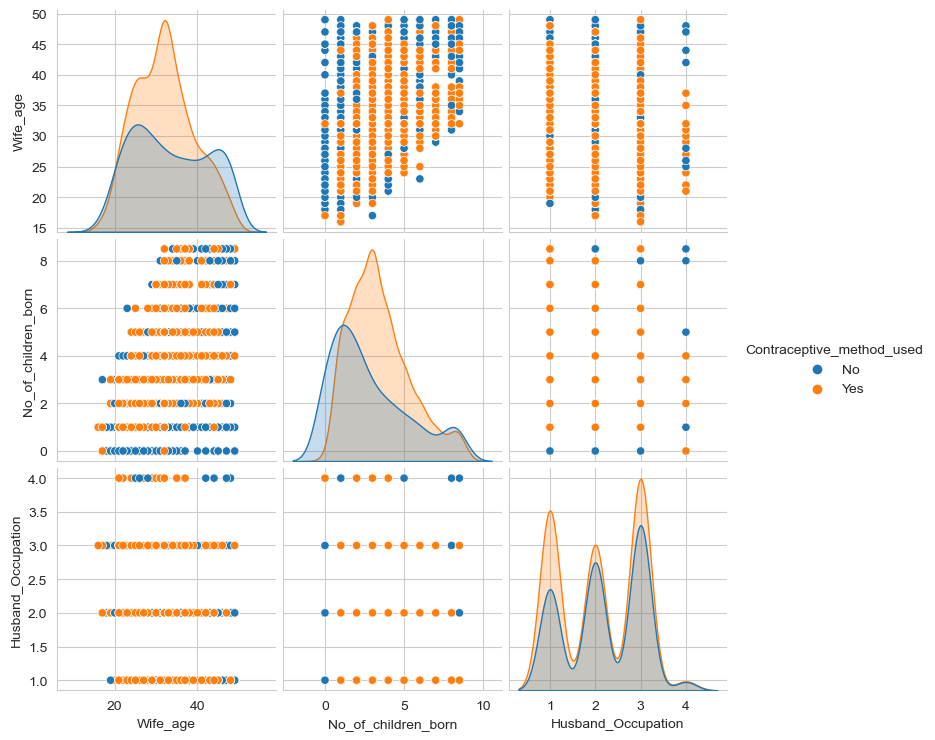

In [1343]:
sns.pairplot(df2 , hue='Contraceptive_method_used', diag_kind = 'kde')

In [1344]:
df2[~df2.applymap(np.isreal).all(1)]

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
0,24.0,Primary,Secondary,3.0,Scientology,No,2.0,High,Exposed,No
1,45.0,Uneducated,Secondary,8.5,Scientology,No,3.0,Very High,Exposed,No
2,43.0,Primary,Secondary,7.0,Scientology,No,3.0,Very High,Exposed,No
3,42.0,Secondary,Primary,8.5,Scientology,No,3.0,High,Exposed,No
4,36.0,Secondary,Secondary,8.0,Scientology,No,3.0,Low,Exposed,No
...,...,...,...,...,...,...,...,...,...,...
1468,33.0,Tertiary,Tertiary,3.0,Scientology,Yes,2.0,Very High,Exposed,Yes
1469,33.0,Tertiary,Tertiary,3.0,Scientology,No,1.0,Very High,Exposed,Yes
1470,39.0,Secondary,Secondary,3.0,Scientology,Yes,1.0,Very High,Exposed,Yes
1471,33.0,Secondary,Secondary,3.0,Scientology,Yes,2.0,Low,Exposed,Yes


In [1345]:

cat_col = df2.select_dtypes(include=['object']).columns

In [1346]:
df2= pd.get_dummies(df2,columns=cat_col,drop_first=True)

In [1347]:
df2.tail()

,Wife_age,No_of_children_born,Husband_Occupation,Wife_ education_Secondary,Wife_ education_Tertiary,Wife_ education_Uneducated,Husband_education_Secondary,Husband_education_Tertiary,Husband_education_Uneducated,Wife_religion_Scientology,Wife_Working_Yes,Standard_of_living_index_Low,Standard_of_living_index_Very High,Standard_of_living_index_Very Low,Media_exposure _Not-Exposed,Contraceptive_method_used_Yes
1468,33.0,3.0,2.0,0,1,0,0,1,0,1,1,0,1,0,0,1
1469,33.0,3.0,1.0,0,1,0,0,1,0,1,0,0,1,0,0,1
1470,39.0,3.0,1.0,1,0,0,1,0,0,1,1,0,1,0,0,1
1471,33.0,3.0,2.0,1,0,0,1,0,0,1,1,1,0,0,0,1
1472,17.0,1.0,2.0,1,0,0,1,0,0,1,0,0,1,0,0,1


In [1348]:
df2.shape

(1473, 16)

In [1349]:
#APPLYING LOGISTIC REGRESSION

In [1350]:
from sklearn.model_selection import train_test_split

from sklearn.linear_model import LogisticRegression

In [1351]:
array = df2.values

In [1352]:
x=array[:,0:15]

In [1353]:
y=array[:,15]

In [1354]:

X_train, X_test, y_train, y_test = train_test_split(x,y,test_size=0.3,random_state=101)

In [1355]:
type(X_train)

numpy.ndarray

In [1356]:
model = LogisticRegression()
model.fit(X_train, y_train)
y_predict = model.predict(X_test)
model_score = model.score(X_test, y_test)

In [1357]:
from sklearn import metrics

In [1358]:
print(model_score)
y1_predict = model.predict(X_train)
print(metrics.confusion_matrix(y_train, y1_predict))
print(metrics.classification_report(y_train, y1_predict))

0.6493212669683258
[[218 214]
 [103 496]]
              precision    recall  f1-score   support

         0.0       0.68      0.50      0.58       432
         1.0       0.70      0.83      0.76       599

    accuracy                           0.69      1031
   macro avg       0.69      0.67      0.67      1031
weighted avg       0.69      0.69      0.68      1031



In [1359]:

print(model_score)
print(metrics.confusion_matrix(y_test, y_predict))
print(metrics.classification_report(y_test, y_predict))

0.6493212669683258
[[ 89 108]
 [ 47 198]]
              precision    recall  f1-score   support

         0.0       0.65      0.45      0.53       197
         1.0       0.65      0.81      0.72       245

    accuracy                           0.65       442
   macro avg       0.65      0.63      0.63       442
weighted avg       0.65      0.65      0.64       442



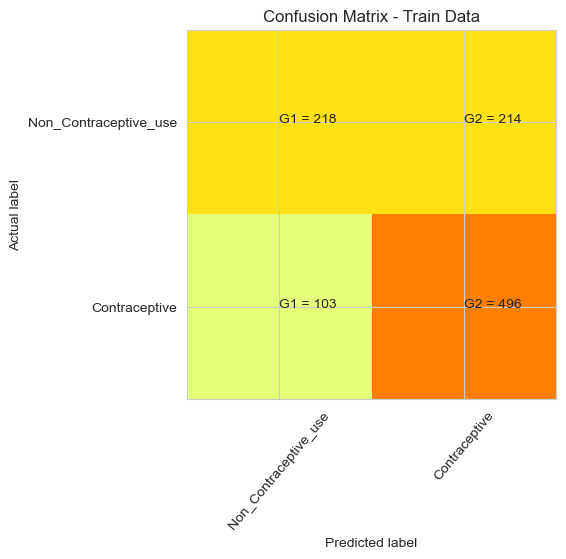

In [1360]:
#CONFUSION MATRIX TRAINIG DATA 
cm = metrics.confusion_matrix(y_train, y1_predict)
plt.clf()
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Wistia)
classNames = ['Non_Contraceptive_use', 'Contraceptive']
plt.title('Confusion Matrix - Train Data')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
tick_marks = np.arange(len(classNames))
plt.xticks(tick_marks, classNames, rotation=50)
plt.yticks(tick_marks, classNames)
s = [['G1', 'G2'], ['G1','G2']]
 
for i in range(2):
    for j in range(2):
        plt.text(j,i, str(s[i][j])+" = "+str(cm[i][j]))
plt.show()

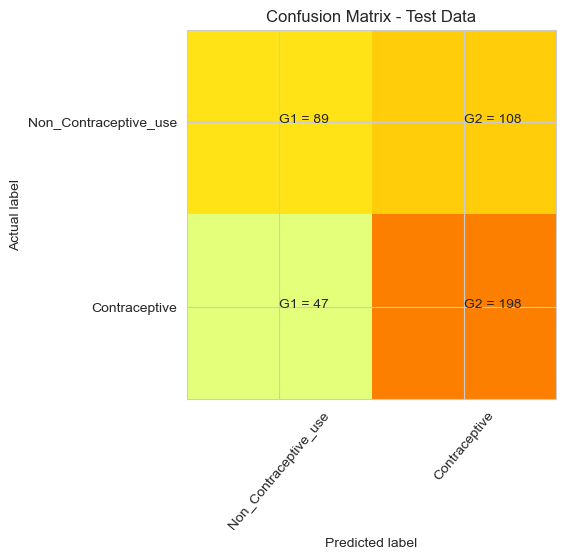

In [1361]:
#CONFUSION MATRIX TEST DATA 
cm = metrics.confusion_matrix(y_test, y_predict)
plt.clf()
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Wistia)
classNames = ['Non_Contraceptive_use', 'Contraceptive']
plt.title('Confusion Matrix - Test Data')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
tick_marks = np.arange(len(classNames))
plt.xticks(tick_marks, classNames, rotation=50)
plt.yticks(tick_marks, classNames)
s = [['G1', 'G2'], ['G1','G2']]
 
for i in range(2):
    for j in range(2):
        plt.text(j,i, str(s[i][j])+" = "+str(cm[i][j]))
plt.show()

In [1362]:
#LDA MODEL

In [1363]:
x=df2.drop('Contraceptive_method_used_Yes',axis=1)

In [1364]:
y=df2['Contraceptive_method_used_Yes']

In [1365]:
X1_train,X1_test, y1_train,y1_test = train_test_split(x,y,test_size=0.3,random_state=101)

In [1366]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn import metrics,model_selection
clf = LinearDiscriminantAnalysis()
model=clf.fit(X1_train,y1_train)

In [1367]:
#INTERCEPT OF lda
clf.intercept_

array([1.57889506])

In [1368]:
X1_train.columns[1]

'No_of_children_born'

In [1369]:
#coeffieceitn of LDA
clf.coef_

array([[-0.08935853,  0.38082614,  0.09030706,  0.6349701 ,  1.54470159,
        -0.3754929 ,  0.17097053, -0.14116475, -0.38729069, -0.46933499,
        -0.12916726, -0.03764121,  0.29537192, -0.39828833, -0.25029414]])

In [1370]:
for idx, col_name in enumerate(X1_train.columns):
    print("The coefficient for {} is {}".format(col_name, clf.coef_[0][idx]))

The coefficient for Wife_age is -0.08935853494596956
The coefficient for No_of_children_born is 0.38082614077700017
The coefficient for Husband_Occupation is 0.09030705841213124
The coefficient for Wife_ education_Secondary is 0.6349700985239196
The coefficient for Wife_ education_Tertiary is 1.5447015885975135
The coefficient for Wife_ education_Uneducated is -0.37549289911044414
The coefficient for Husband_education_Secondary is 0.17097052569898152
The coefficient for Husband_education_Tertiary is -0.14116474811655483
The coefficient for Husband_education_Uneducated is -0.3872906896794378
The coefficient for Wife_religion_Scientology is -0.4693349895134461
The coefficient for Wife_Working_Yes is -0.12916726253578836
The coefficient for Standard_of_living_index_Low is -0.03764120954991867
The coefficient for Standard_of_living_index_Very High is 0.2953719197526194
The coefficient for Standard_of_living_index_Very Low is -0.39828832728498603
The coefficient for Media_exposure _Not-Expo

In [1371]:
X1_train.columns

Index(['Wife_age', 'No_of_children_born', 'Husband_Occupation',
       'Wife_ education_Secondary', 'Wife_ education_Tertiary',
       'Wife_ education_Uneducated', 'Husband_education_Secondary',
       'Husband_education_Tertiary', 'Husband_education_Uneducated',
       'Wife_religion_Scientology', 'Wife_Working_Yes',
       'Standard_of_living_index_Low', 'Standard_of_living_index_Very High',
       'Standard_of_living_index_Very Low', 'Media_exposure _Not-Exposed'],
      dtype='object')

In [1372]:
print('Contraceptive_method_used = ')
for i in range(len(X1_train.columns)):
    print('{} x {} +'.format(round(clf.coef_[0][i],2),X1_train.columns[i]),end=" ")

Contraceptive_method_used = 
-0.09 x Wife_age + 0.38 x No_of_children_born + 0.09 x Husband_Occupation + 0.63 x Wife_ education_Secondary + 1.54 x Wife_ education_Tertiary + -0.38 x Wife_ education_Uneducated + 0.17 x Husband_education_Secondary + -0.14 x Husband_education_Tertiary + -0.39 x Husband_education_Uneducated + -0.47 x Wife_religion_Scientology + -0.13 x Wife_Working_Yes + -0.04 x Standard_of_living_index_Low + 0.3 x Standard_of_living_index_Very High + -0.4 x Standard_of_living_index_Very Low + -0.25 x Media_exposure _Not-Exposed + 

From the provided equation and coefficients, it's evident that the predictor "Wife_education_Tertiary" holds the highest magnitude, suggesting a significant impact on classification. On the other hand, the predictor "Wife_religion_Scientology" possesses the smallest magnitude, indicating a relatively lesser influence on classification, helping discern the least.

In [1373]:
#CONFUSION mATRIX 
pred_class_train = model.predict(X1_train)
pred_class_test = model.predict(X1_test)

CONFUSION MATRIX:


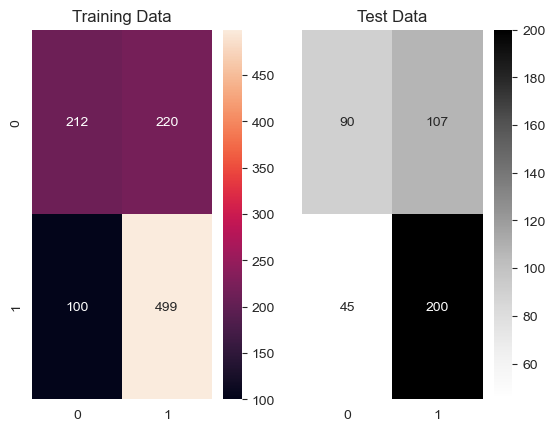

In [1374]:
f,a =  plt.subplots(1,2,sharex=True,sharey=True,squeeze=False)

#Plotting confusion matrix for models for the Training Data
print('CONFUSION MATRIX:')

plot_0 = sns.heatmap((metrics.confusion_matrix(y1_train,pred_class_train)),annot=True,fmt='.5g',ax=a[0][0]);
a[0][0].set_title('Training Data')

plot_1 = sns.heatmap((metrics.confusion_matrix(y1_test,pred_class_test)),annot=True,fmt='.5g',cmap='Greys',ax=a[0][1]);
a[0][1].set_title('Test Data');

In [1375]:
#CLASS REPORT FOR TRAINING DATA
print('Classification Report of the training data:\n\n',metrics.classification_report(y1_train,pred_class_train),'\n')

Classification Report of the training data:

               precision    recall  f1-score   support

           0       0.68      0.49      0.57       432
           1       0.69      0.83      0.76       599

    accuracy                           0.69      1031
   macro avg       0.69      0.66      0.66      1031
weighted avg       0.69      0.69      0.68      1031
 



In [1376]:
#CLASS REPORT FOR TEST DATA 
print('Classification Report of the test data:\n\n',metrics.classification_report(y1_test,pred_class_test),'\n')

Classification Report of the test data:

               precision    recall  f1-score   support

           0       0.67      0.46      0.54       197
           1       0.65      0.82      0.72       245

    accuracy                           0.66       442
   macro avg       0.66      0.64      0.63       442
weighted avg       0.66      0.66      0.64       442
 



In [1377]:
#AUC ROC

In [1378]:
pred_prob_train = model.predict_proba(X1_train)
pred_prob_test = model.predict_proba(X1_test)

AUC for the Training Data: 0.723
AUC for the Test Data: 0.705


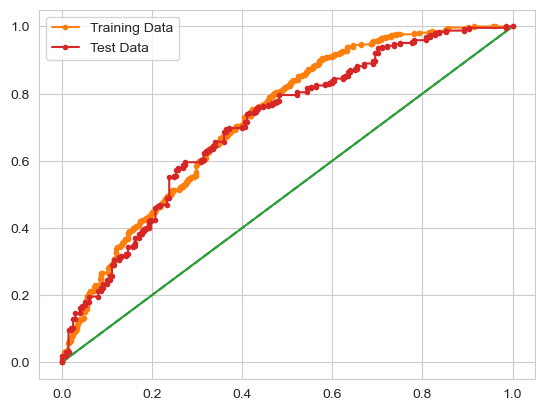

In [1379]:
# AUC and ROC for the training data

# calc AUC
auc = metrics.roc_auc_score(y1_train,pred_prob_train[:,1])
print('AUC for the Training Data: %.3f' % auc)

#  calc roc curve
fpr, tpr, thresholds = metrics.roc_curve(y1_train,pred_prob_train[:,1])
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve 
plt.plot(fpr, tpr, marker='.',label = 'Training Data')


# AUC and ROC for the test data

# calc AUC
auc = metrics.roc_auc_score(y1_test,pred_prob_test[:,1])
print('AUC for the Test Data: %.3f' % auc)

#  calc roc curve
fpr, tpr, thresholds = metrics.roc_curve(y1_test,pred_prob_test[:,1])
plt.plot([0, 1], [0, 1], linestyle='-')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.',label='Test Data')
# show the plot
plt.legend(loc='best')
plt.show()

In [1380]:
#CART
from sklearn.tree import DecisionTreeClassifier

In [1381]:
X2_train,X2_test, y2_train,y2_test = train_test_split(x,y,test_size=0.3,random_state=101) 
dt_model = DecisionTreeClassifier(criterion = 'gini', random_state=1)
dt_model.fit(X2_train, y2_train)

DecisionTreeClassifier(random_state=1)

In [1382]:
from sklearn import tree

train_char_label = ['No', 'Yes']
ld_Tree_File = open('ld_Tree_File.dot','w')
dot_data = tree.export_graphviz(dt_model, 
                                out_file=ld_Tree_File, 
                                feature_names = list(X2_train), 
                                class_names = list(train_char_label))

ld_Tree_File.close()

In [1383]:
print (pd.DataFrame(dt_model.feature_importances_, columns = ["Imp"], index = X2_train.columns).sort_values('Imp',ascending=False))

                                         Imp
Wife_age                            0.313043
No_of_children_born                 0.247081
Wife_ education_Tertiary            0.079041
Husband_Occupation                  0.078255
Standard_of_living_index_Very High  0.049544
Wife_Working_Yes                    0.040193
Standard_of_living_index_Low        0.033109
Husband_education_Tertiary          0.031088
Standard_of_living_index_Very Low   0.028611
Wife_religion_Scientology           0.026329
Wife_ education_Secondary           0.021614
Husband_education_Secondary         0.019466
Wife_ education_Uneducated          0.017043
Media_exposure _Not-Exposed         0.009989
Husband_education_Uneducated        0.005595


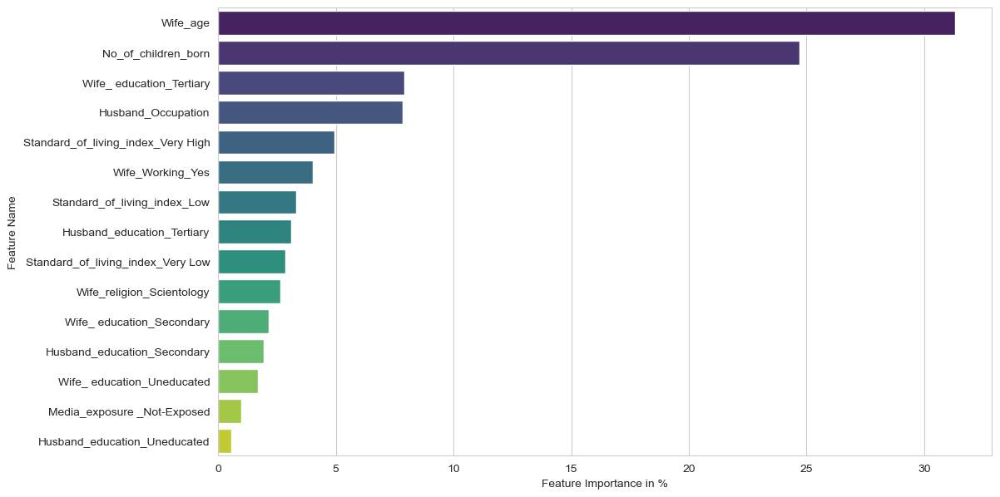

In [1384]:
x = pd.DataFrame(dt_model.feature_importances_ * 100, index=X2_train.columns).sort_values(by=0, ascending=False)
plt.figure(figsize=(12, 7))
sns.barplot(x=x[0], y=x.index, palette='viridis')
plt.ylabel('Feature Name')
plt.xlabel('Feature Importance in %')
plt.show()

In [1385]:
y_predict = dt_model.predict(X_test)

In [1386]:
reg_dt_model = DecisionTreeClassifier(criterion = 'gini', max_depth = 30,min_samples_leaf=50,min_samples_split=100,random_state=1)
reg_dt_model.fit(X2_train, y2_train)

DecisionTreeClassifier(max_depth=30, min_samples_leaf=50, min_samples_split=100,
                       random_state=1)

In [1387]:
ld_tree_regularized = open('ld_tree_regularized.dot','w')
dot_data = tree.export_graphviz(reg_dt_model, out_file= ld_tree_regularized , feature_names = list(X2_train), class_names = list(train_char_label))

ld_tree_regularized.close()
dot_data

In [1388]:
print (pd.DataFrame(reg_dt_model.feature_importances_, columns = ["Imp"], index = X2_train.columns).sort_values('Imp',ascending=False))

                                         Imp
No_of_children_born                 0.435702
Wife_ education_Tertiary            0.263276
Wife_age                            0.203375
Wife_ education_Uneducated          0.037734
Wife_ education_Secondary           0.028732
Wife_Working_Yes                    0.012235
Husband_Occupation                  0.010971
Husband_education_Tertiary          0.007976
Husband_education_Secondary         0.000000
Husband_education_Uneducated        0.000000
Wife_religion_Scientology           0.000000
Standard_of_living_index_Low        0.000000
Standard_of_living_index_Very High  0.000000
Standard_of_living_index_Very Low   0.000000
Media_exposure _Not-Exposed         0.000000


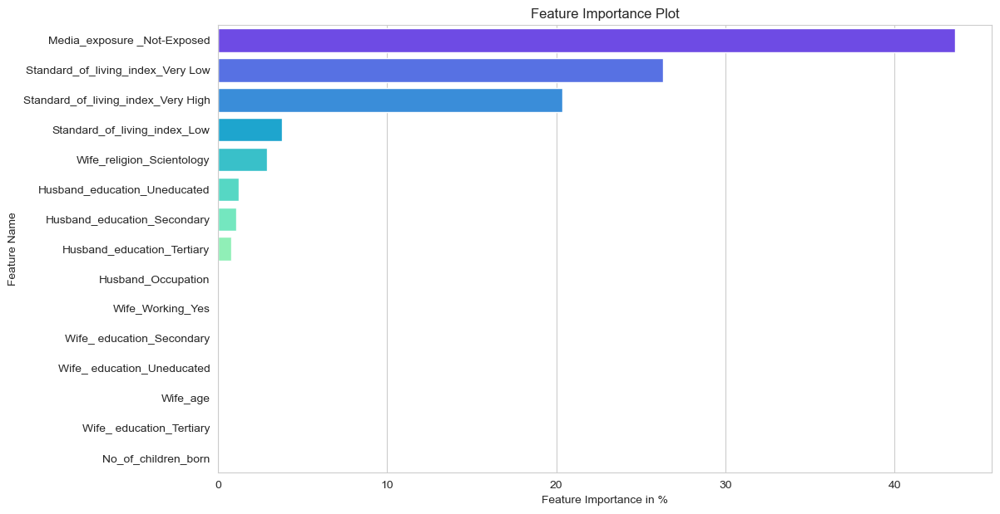

In [1389]:
plt.figure(figsize=(12, 7))
sns.barplot(x=feature_importance[0], y=feature_importance.index[::-1], palette='rainbow')
plt.xlabel('Feature Importance in %')
plt.ylabel('Feature Name')
plt.title('Feature Importance Plot')
plt.show()

In [1390]:

ytrain_predict = reg_dt_model.predict(X2_train)
ytest_predict = reg_dt_model.predict(X2_test)

In [1391]:
ytest_predict

array([1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1,
       1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0,
       1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0,
       0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1,
       1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1,
       1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1,
       1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1,
       0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1,
       1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1,
       1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1,
       1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1,
       0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1,
       0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0,

In [1392]:
ytest_predict_prob=reg_dt_model.predict_proba(X2_test)
ytest_predict_prob

array([[0.15      , 0.85      ],
       [0.36538462, 0.63461538],
       [0.37037037, 0.62962963],
       [0.37179487, 0.62820513],
       [0.58181818, 0.41818182],
       [0.55421687, 0.44578313],
       [0.37179487, 0.62820513],
       [0.15      , 0.85      ],
       [0.36538462, 0.63461538],
       [0.18518519, 0.81481481],
       [0.15      , 0.85      ],
       [0.71929825, 0.28070175],
       [0.36538462, 0.63461538],
       [0.29411765, 0.70588235],
       [0.29411765, 0.70588235],
       [0.71929825, 0.28070175],
       [0.18309859, 0.81690141],
       [0.71929825, 0.28070175],
       [0.98550725, 0.01449275],
       [0.18309859, 0.81690141],
       [0.55421687, 0.44578313],
       [0.37179487, 0.62820513],
       [0.29411765, 0.70588235],
       [0.18309859, 0.81690141],
       [0.29411765, 0.70588235],
       [0.23287671, 0.76712329],
       [0.18518519, 0.81481481],
       [0.18518519, 0.81481481],
       [0.36538462, 0.63461538],
       [0.29411765, 0.70588235],
       [0.

In [1393]:

pd.DataFrame(ytest_predict_prob).head()

,0,1
0,0.150000,0.850000
1,0.365385,0.634615
2,0.370370,0.629630
3,0.371795,0.628205
4,0.581818,0.418182


AUC: 0.782


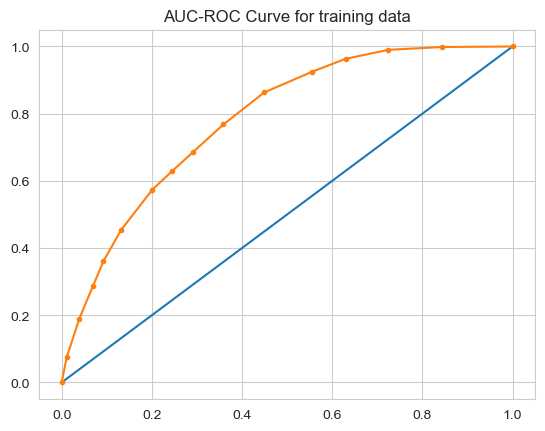

In [1394]:
# predict probabilities
probs = reg_dt_model.predict_proba(X2_train)

probs = probs[:, 1]
# calculate AUC
from sklearn.metrics import roc_auc_score
auc = roc_auc_score(y2_train, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
from sklearn.metrics import roc_curve
fpr, tpr, thresholds = roc_curve(y2_train, probs)
plt.plot([0, 1], [0, 1], linestyle='-')
# plot the roc curve
plt.plot(fpr, tpr, marker='.')
plt.title('AUC-ROC Curve for training data')
# show the plot
plt.show()

AUC: 0.736


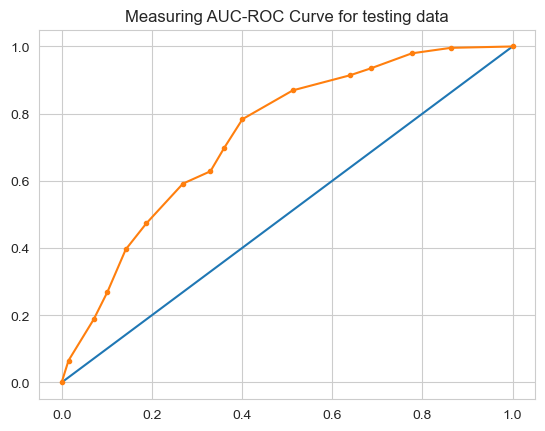

In [1395]:
# predict probabilities
probs = reg_dt_model.predict_proba(X2_test)

probs = probs[:, 1]
# calculate AUC
from sklearn.metrics import roc_auc_score
auc = roc_auc_score(y2_test, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
from sklearn.metrics import roc_curve
fpr, tpr, thresholds = roc_curve(y2_test, probs)
plt.plot([0, 1], [0, 1], linestyle='-')
# plot the roc curve
plt.plot(fpr, tpr, marker='.')
plt.title('Measuring AUC-ROC Curve for testing data')
# show the plot
plt.show()

In [1396]:
#Confusion Matrix for the training

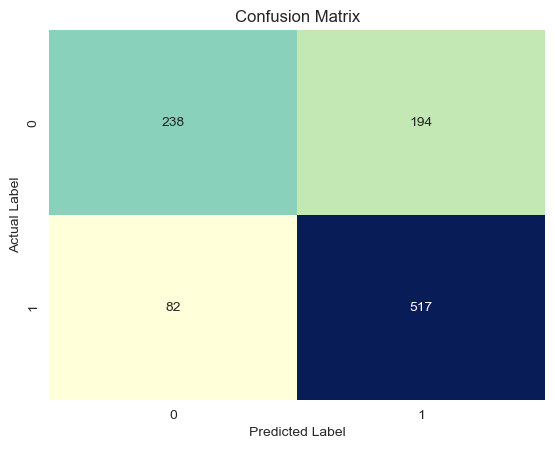

In [1397]:
from sklearn.metrics import classification_report,confusion_matrix
confusion_matrix(y2_train, ytrain_predict)
sns.heatmap(confusion_matrix(y2_train,ytrain_predict),annot=True, fmt='d', cbar=False,cmap='YlGnBu')
plt.xlabel('Predicted Label')
plt.ylabel('Actual Label')
plt.title('Confusion Matrix')
plt.show()

In [1398]:
reg_dt_model.score(X2_train,y2_train) #train data accuracy
print((238+517)/(238+194+82+517))
print(classification_report(y2_train, ytrain_predict))

0.7322987390882638
              precision    recall  f1-score   support

           0       0.74      0.55      0.63       432
           1       0.73      0.86      0.79       599

    accuracy                           0.73      1031
   macro avg       0.74      0.71      0.71      1031
weighted avg       0.73      0.73      0.72      1031



In [1399]:
#CONFUSION MATRIX FOR TEST 
confusion_matrix(y2_test, ytest_predict)
reg_dt_model.score(X_test,y2_test)

0.6990950226244343

In [1400]:

print(classification_report(y2_test, ytest_predict))

              precision    recall  f1-score   support

           0       0.75      0.49      0.59       197
           1       0.68      0.87      0.76       245

    accuracy                           0.70       442
   macro avg       0.71      0.68      0.68       442
weighted avg       0.71      0.70      0.69       442



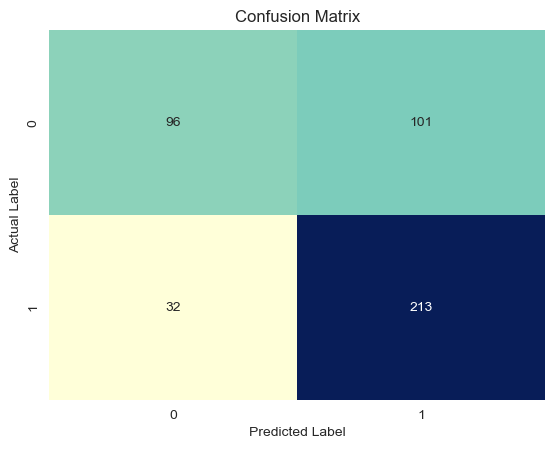

In [1401]:
sns.heatmap(confusion_matrix(y2_test,ytest_predict),annot=True, fmt='d', cbar=False,cmap='YlGnBu')
plt.xlabel('Predicted Label')
plt.ylabel('Actual Label')
plt.title('Confusion Matrix')
plt.show()